In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 louvain==0.7.1 pynndescent==0.5.6


In [3]:
S7 = sc.read_10x_mtx('S7/filtered_feature_bc_matrix/',cache=True)  
S8 = sc.read_10x_mtx('S8/filtered_feature_bc_matrix/',cache=True)
S9 = sc.read_10x_mtx('S9/filtered_feature_bc_matrix/',cache=True)
S10 = sc.read_10x_mtx('S10/filtered_feature_bc_matrix/',cache=True)

... reading from cache file cache/S7-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S8-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S9-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S10-filtered_feature_bc_matrix-matrix.h5ad


In [4]:
S7.obs['sample'] = 'Cre-'
S8.obs['sample'] = 'Cre-'
S9.obs['sample'] = 'Cre+'
S10.obs['sample'] = 'Cre+'

In [5]:
S7.var_names_make_unique()
S8.var_names_make_unique()
S9.var_names_make_unique()
S10.var_names_make_unique()

normalizing counts per cell
    finished (0:00:00)


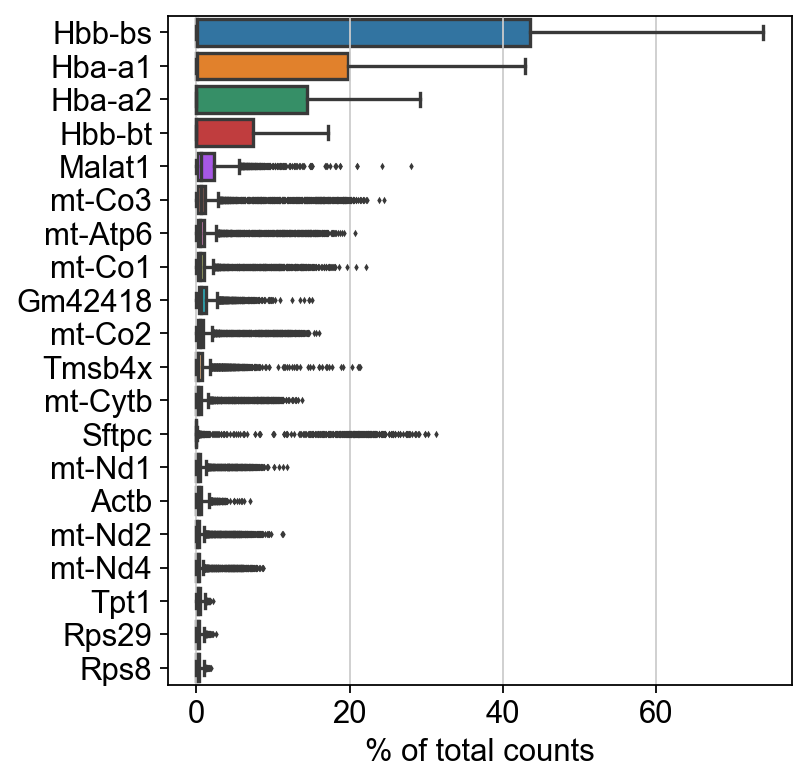

normalizing counts per cell
    finished (0:00:00)


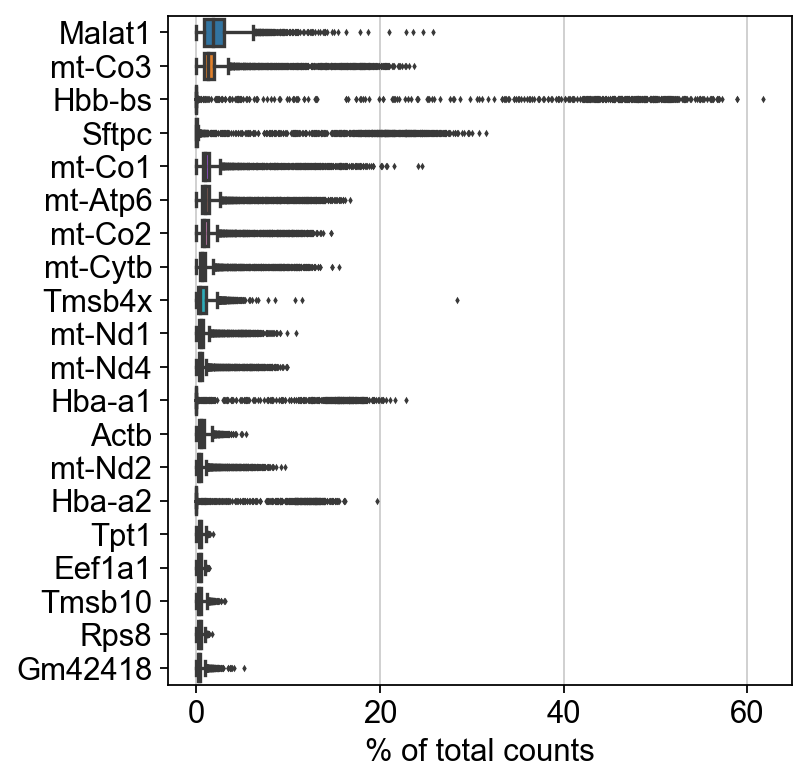

normalizing counts per cell
    finished (0:00:00)


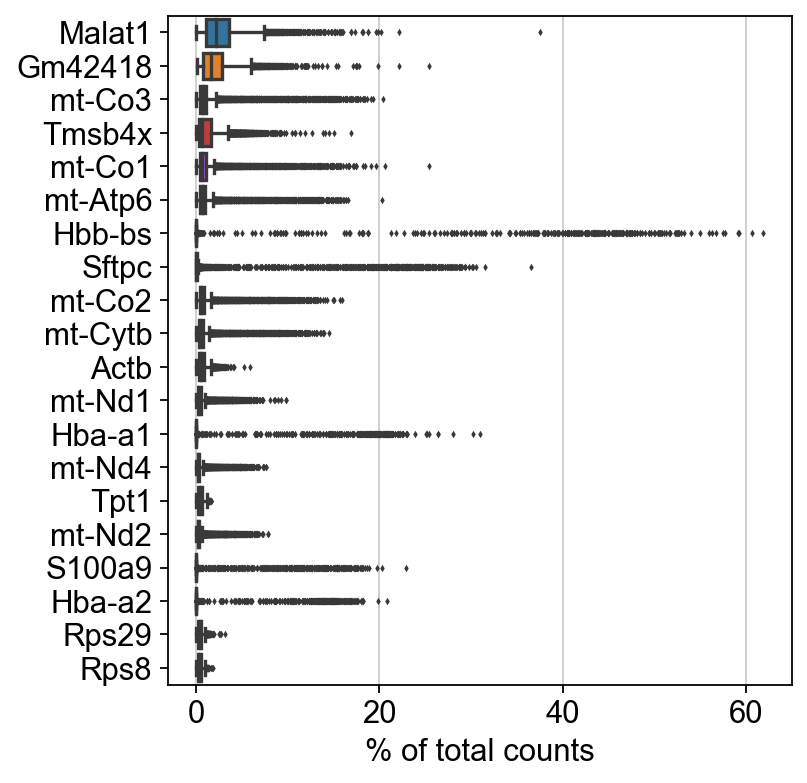

normalizing counts per cell
    finished (0:00:00)


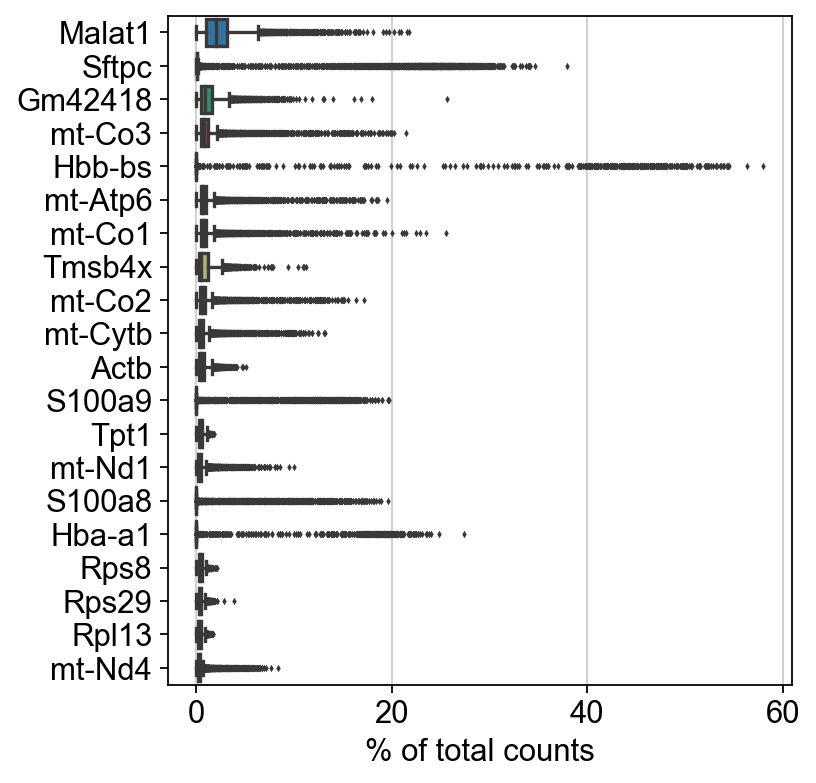

In [6]:
sc.pl.highest_expr_genes(S7, n_top=20, )
sc.pl.highest_expr_genes(S8, n_top=20, )
sc.pl.highest_expr_genes(S9, n_top=20, )
sc.pl.highest_expr_genes(S10, n_top=20, )

In [7]:
sc.pp.filter_cells(S7, min_genes=200)
sc.pp.filter_genes(S7, min_cells=3)
sc.pp.filter_cells(S8, min_genes=200)
sc.pp.filter_genes(S8, min_cells=3)
sc.pp.filter_cells(S9, min_genes=200)
sc.pp.filter_genes(S9, min_cells=3)
sc.pp.filter_cells(S10, min_genes=200)
sc.pp.filter_genes(S10, min_cells=3)

filtered out 2923 cells that have less than 200 genes expressed
filtered out 13159 genes that are detected in less than 3 cells
filtered out 400 cells that have less than 200 genes expressed
filtered out 12845 genes that are detected in less than 3 cells
filtered out 261 cells that have less than 200 genes expressed
filtered out 12304 genes that are detected in less than 3 cells
filtered out 297 cells that have less than 200 genes expressed
filtered out 12067 genes that are detected in less than 3 cells


In [8]:
adata = S7.concatenate(S8,S9,S10)

In [9]:
print(adata.obs['sample'].value_counts())

Cre+    20521
Cre-    14336
Name: sample, dtype: int64


In [10]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('mt-') 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^Hb[^(p)]"))

adata.var

,gene_ids,feature_types,n_cells-0,n_cells-1,n_cells-2,n_cells-3,mt,ribo,hb
Xkr4,ENSMUSG00000051951,Gene Expression,40,53,47,81,False,False,False
Gm19938,ENSMUSG00000102331,Gene Expression,83,126,70,77,False,False,False
Rp1,ENSMUSG00000025900,Gene Expression,37,32,56,63,False,False,False
Sox17,ENSMUSG00000025902,Gene Expression,1471,1408,1804,2236,False,False,False
Gm37587,ENSMUSG00000104238,Gene Expression,69,57,61,67,False,False,False
...,...,...,...,...,...,...,...,...,...
Vamp7,ENSMUSG00000051412,Gene Expression,919,1395,1351,1940,False,False,False
Spry3,ENSMUSG00000061654,Gene Expression,7,14,10,7,False,False,False
Tmlhe,ENSMUSG00000079834,Gene Expression,144,104,200,219,False,False,False
CAAA01147332.1,ENSMUSG00000095742,Gene Expression,279,411,610,487,False,False,False


In [11]:
sc.pp.calculate_qc_metrics(adata,qc_vars=['mt','ribo','hb'],percent_top=None,log1p=False,inplace=True)

In [12]:
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'sample' as categorical
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'feature_types' as categorical


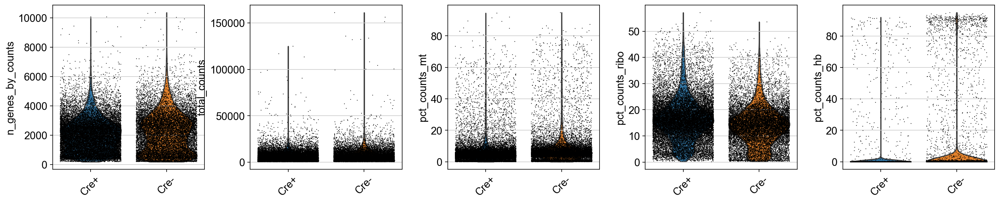

In [13]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

normalizing counts per cell
    finished (0:00:00)


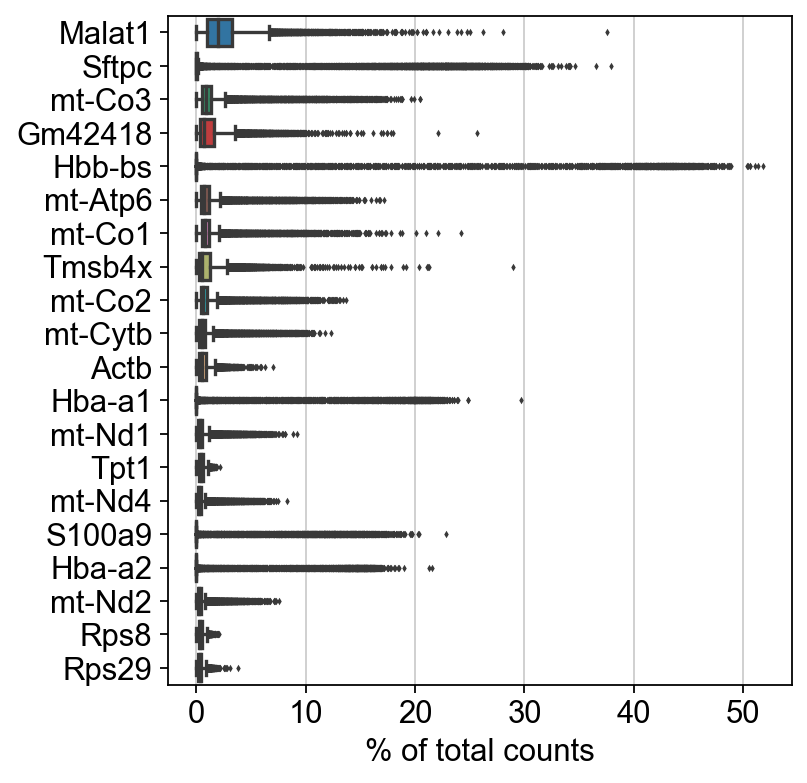

In [14]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [15]:
# filter for percent mito
adata = adata[adata.obs['pct_counts_mt'] < 16, :]

# filter for percent hb > 5
adata = adata[adata.obs['pct_counts_hb'] < 5, :]

# filter for percent ribo > 5
adata = adata[adata.obs['pct_counts_ribo'] > 15, :]

print("Remaining cells %d"%adata.n_obs)

Remaining cells 17157


normalizing counts per cell


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


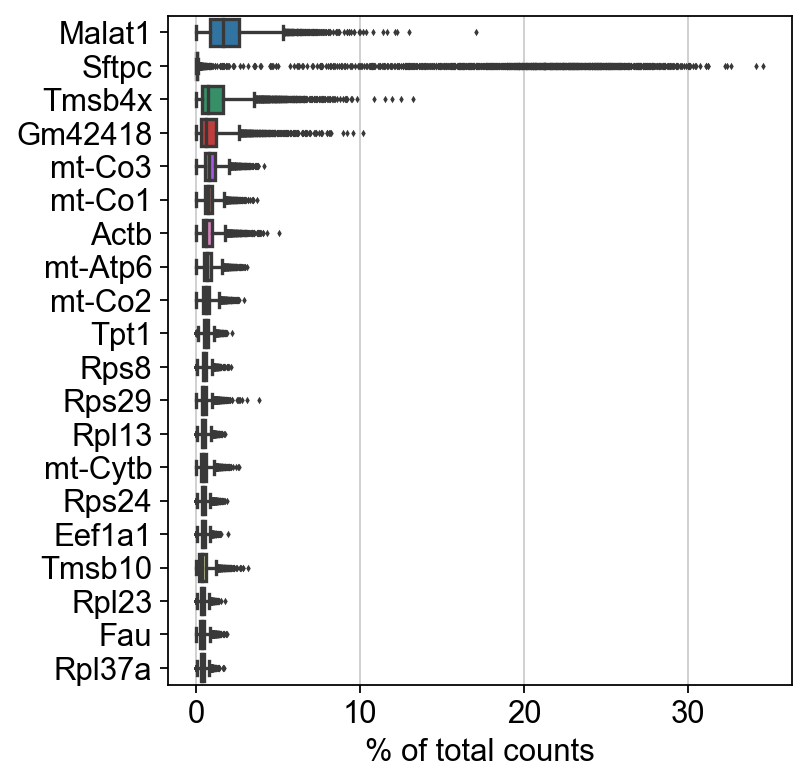

In [16]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [17]:
malat1 = adata.var_names.str.startswith('Malat1')
# we need to redefine the mito_genes since they were first 
# calculated on the full object before removing low expressed genes.
mito_genes = adata.var_names.str.startswith('mt-')
hb_genes = adata.var_names.str.contains(("^Hb[^(p)]"))
rb_genes = adata.var_names.str.startswith(("Rps","Rpl"))


remove = np.add(mito_genes,malat1)
remove1 = np.add(remove,hb_genes)
remove2 = np.add(remove1,rb_genes)
keep = np.invert(remove2)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

17157 18164


normalizing counts per cell


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


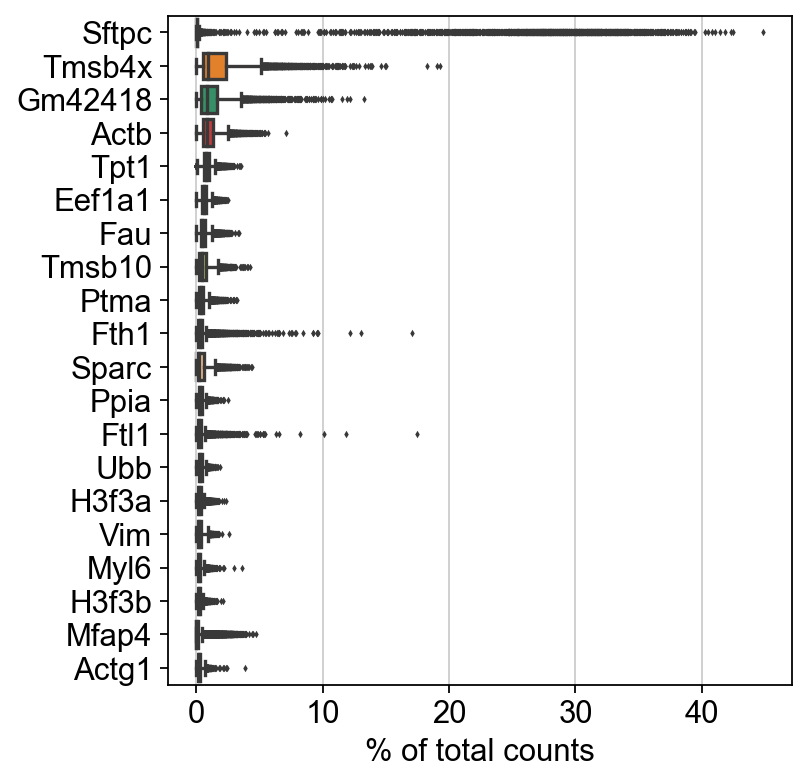

In [18]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [19]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

print(adata.n_obs, adata.n_vars)

filtered out 5 genes that are detected in less than 3 cells
17157 18159


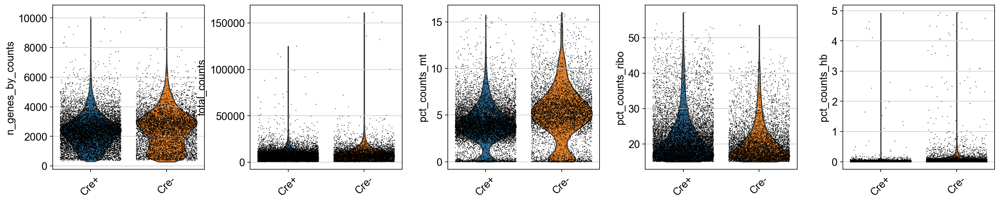

In [20]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

normalizing counts per cell
    finished (0:00:00)


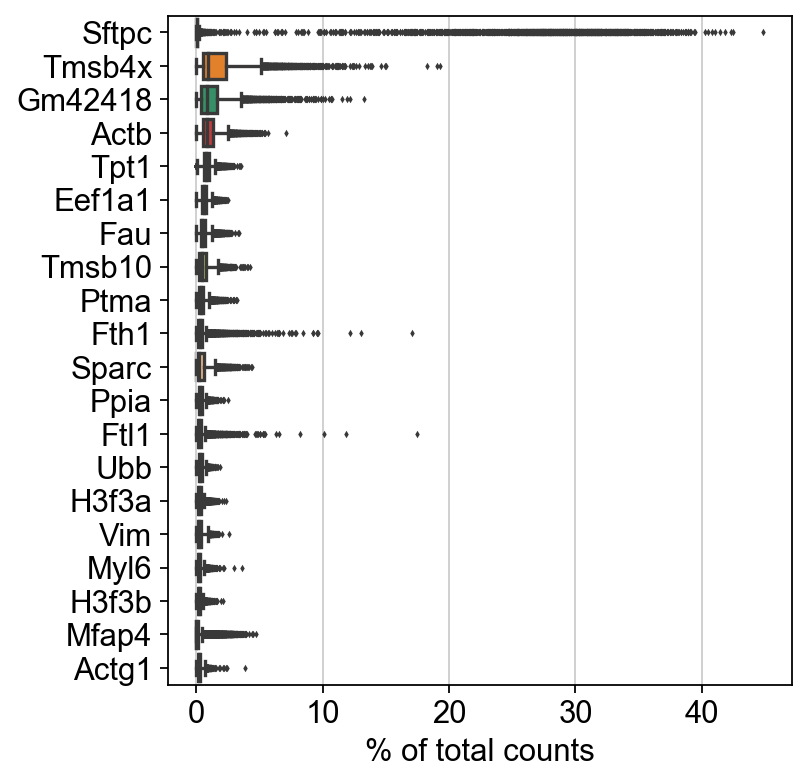

In [21]:
sc.pl.highest_expr_genes(adata, n_top=20, )

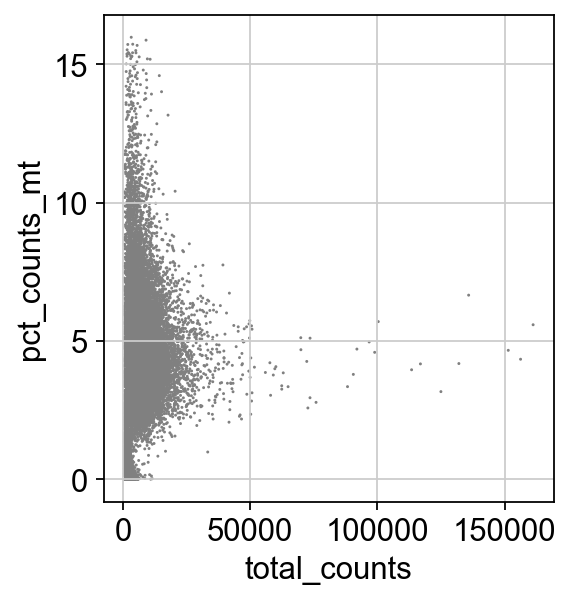

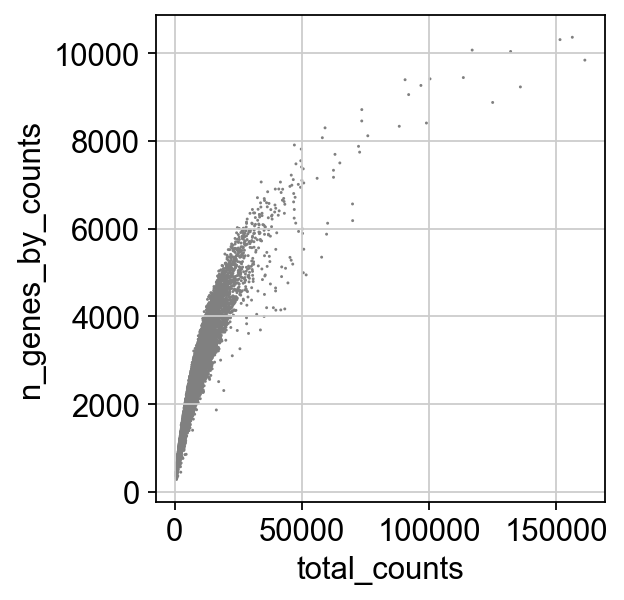

In [22]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [23]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [24]:
sc.pp.log1p(adata)

In [25]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


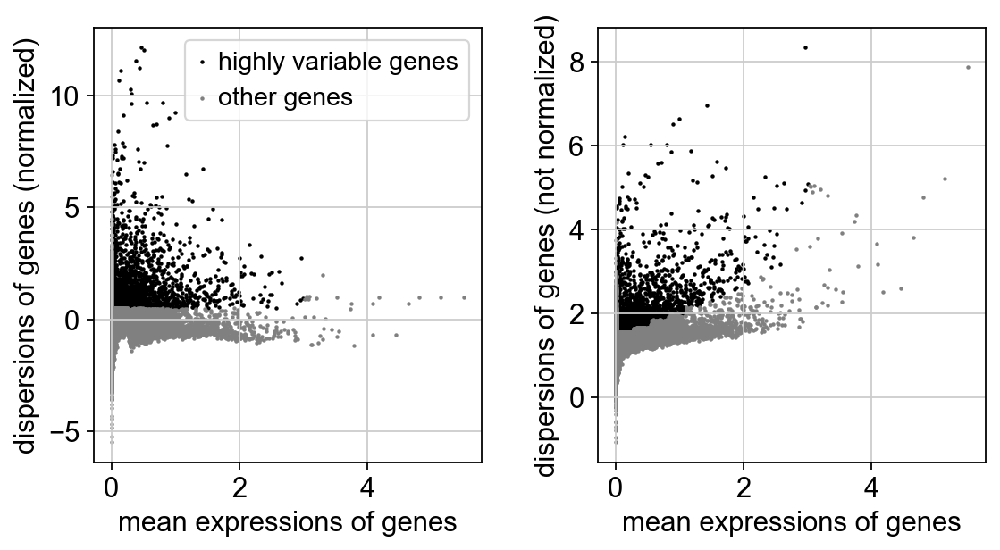

In [26]:
sc.pl.highly_variable_genes(adata)

In [27]:
adata.raw = adata

In [28]:
adata = adata[:, adata.var.highly_variable]

In [29]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [30]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'sample_colors', 'log1p', 'hvg'

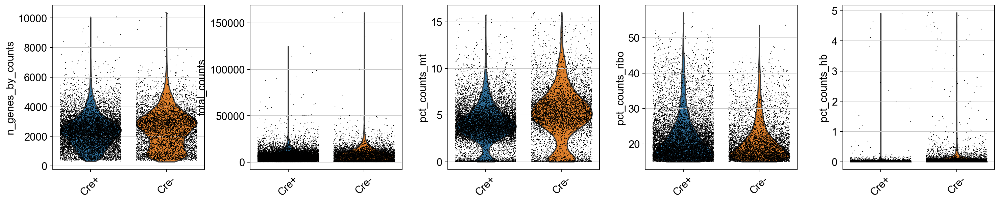

In [31]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

In [32]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


In [33]:
print(adata.obs['sample'].value_counts())

Cre+    11192
Cre-     5965
Name: sample, dtype: int64


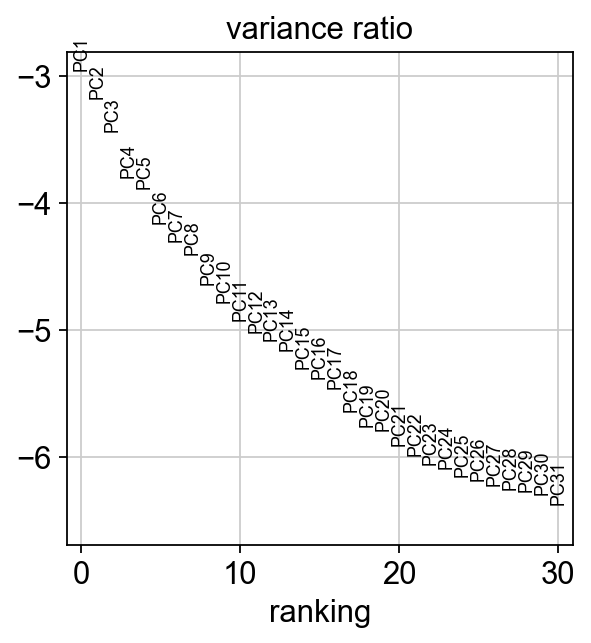

In [34]:
sc.pl.pca_variance_ratio(adata, log=True)

In [35]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)


In [36]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


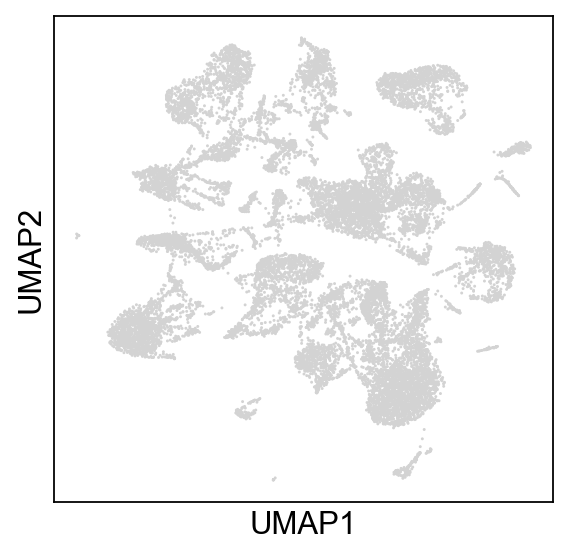

In [37]:
sc.pl.umap(adata)

In [38]:
sc.tl.leiden(adata, key_added = "leiden_10") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.3, key_added = "leiden_03")
sc.tl.leiden(adata, resolution = 0.2, key_added = "leiden_02")
sc.tl.leiden(adata, resolution = 0.1, key_added = "leiden_01")
sc.tl.leiden(adata, resolution = 0.01, key_added = "leiden_001")

#have labelled the leiden clustering without the decimal points for easier code-writing

running Leiden clustering
    finished: found 47 clusters and added
    'leiden_10', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden_03', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden_01', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_001', the cluster labels (adata.obs, categorical) (0:00:00)


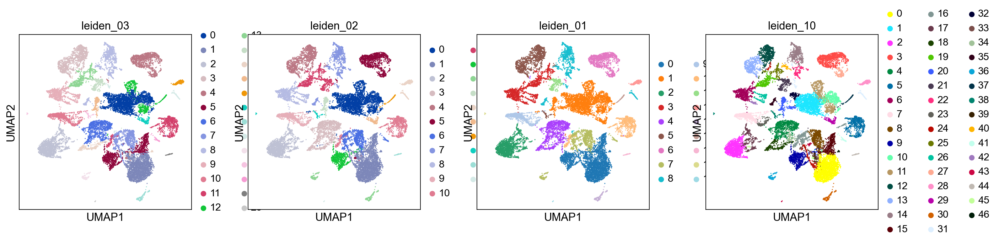

In [39]:
sc.pl.umap(adata, color=['leiden_03','leiden_02', 'leiden_01','leiden_10'])

In [40]:
import numpy as np
import pandas as pd
import scanpy as sc
import gseapy
import matplotlib.pyplot as plt

sc.settings.verbosity = 2             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()

In [41]:
sc.settings.set_figure_params(dpi=80)

In [42]:
adata = adata[:, adata.var.highly_variable]

In [43]:
print(adata.X.shape)
print(adata.raw.X.shape)
print(adata.raw.X[:10,:10])

(17157, 2789)
(17157, 18159)
  (0, 5)	2.8685405
  (1, 7)	0.5363904
  (1, 8)	0.88362205
  (1, 9)	0.88362205
  (2, 5)	1.0088568
  (2, 6)	1.0088568
  (2, 7)	1.5007224
  (2, 8)	1.5007224
  (3, 3)	2.3728223
  (4, 0)	0.5261623
  (4, 5)	0.5261623
  (4, 9)	1.4956249
  (5, 5)	0.7079437
  (5, 6)	0.93402046
  (5, 7)	0.93402046
  (5, 9)	0.7079437
  (6, 3)	1.5578979
  (6, 9)	1.055849
  (7, 3)	2.887122
  (7, 6)	0.6374563
  (7, 7)	0.6374563
  (7, 9)	1.0236466
  (8, 7)	2.596922
  (9, 3)	2.5085158


In [44]:
adata

View of AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_10', 'leiden_03', 'leiden_02', 'leiden_01', 'leiden_001'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_03_colors', 'leiden_02_colors', 'leiden_01_colors', 'leiden_10_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [45]:
adata.write_h5ad('adata_afterleidenclustering_feb28_2022.h5ad')

In [46]:
sc.tl.dendrogram(adata,'sample')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample']`


Trying to set attribute `._uns` of view, copying.


ranking genes


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame i

    finished (0:00:22)


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(


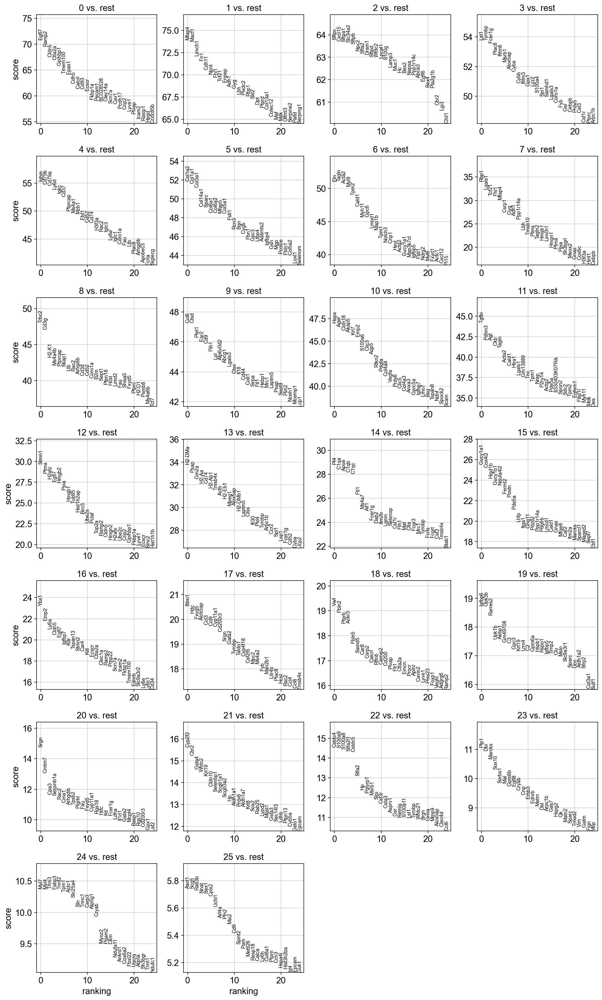

In [47]:
sc.tl.rank_genes_groups(adata,'leiden_03', method='wilcoxon', key_added = "wilcoxon",group = "sample")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

categories: Cre+, Cre-
var_group_labels: 0, 1, 2, etc.


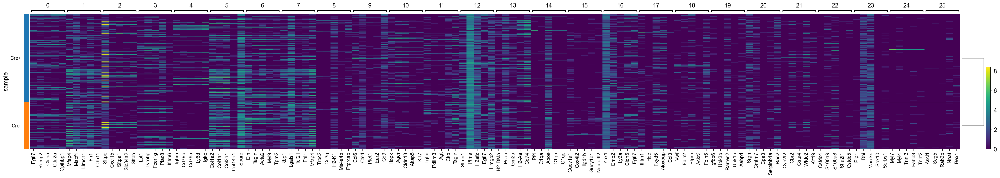

In [48]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="wilcoxon", groupby="sample", show_gene_labels=True)

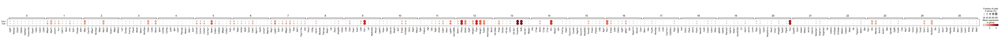

In [49]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=10,key="wilcoxon",groupby="sample")

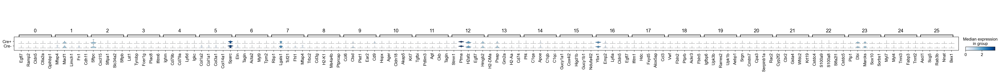

In [50]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="wilcoxon", groupby="sample")

ranking genes
    finished (0:00:18)


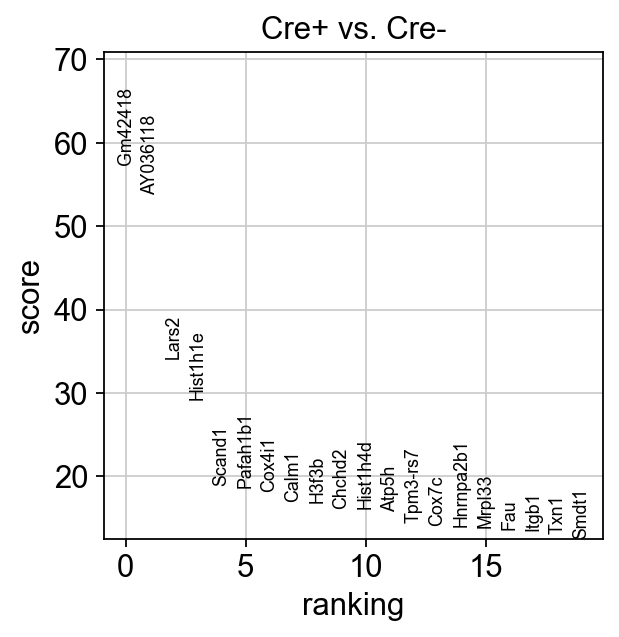

In [51]:
sc.tl.rank_genes_groups(adata, 'sample', groups=['Cre+'], reference='Cre-', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['Cre+'], n_genes=20)

ranking genes
    finished (0:00:17)


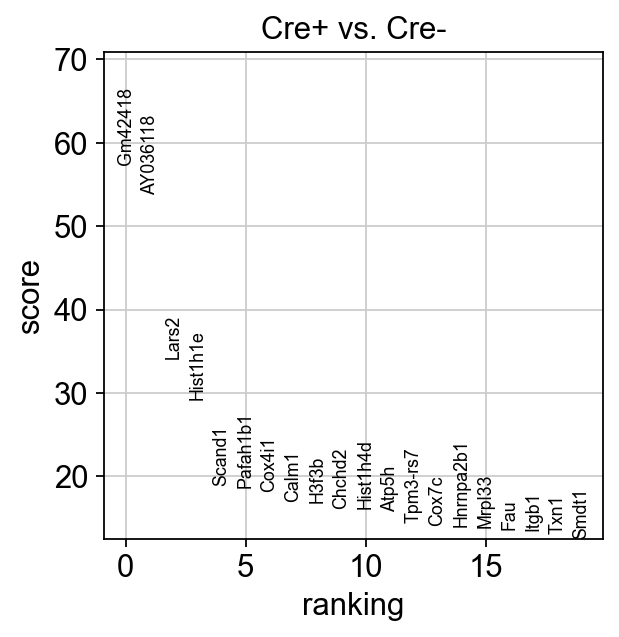

In [52]:
sc.tl.rank_genes_groups(adata,'sample', groups=['Cre+'], reference='Cre-', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['Cre+'], n_genes=20)

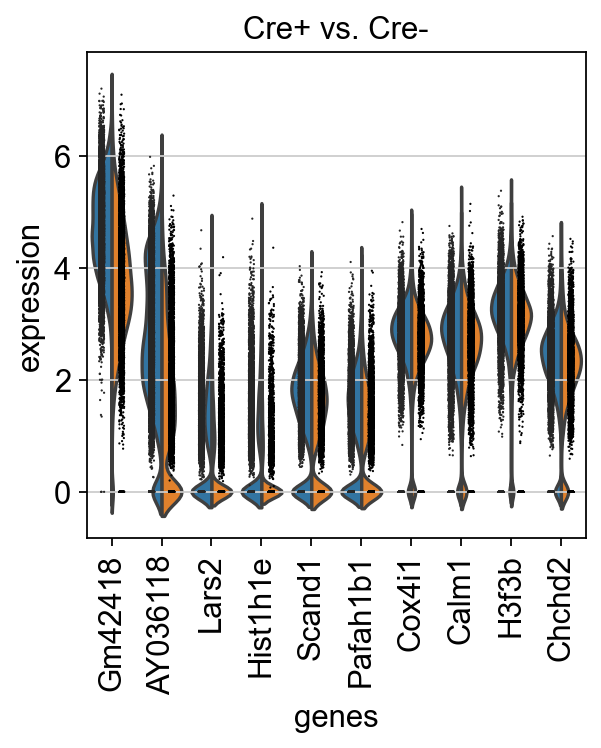

In [53]:
sc.pl.rank_genes_groups_violin(adata,groups='Cre+', n_genes=10)

In [54]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_10', 'leiden_03', 'leiden_02', 'leiden_01', 'leiden_001'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_03_colors', 'leiden_02_colors', 'leiden_01_colors', 'leiden_10_colors', 'dendrogram_sample', 'wilcoxon', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [55]:
adata.obs

,sample,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,leiden_10,leiden_03,leiden_02,leiden_01,leiden_001
AAACCCAAGGAAGTAG-1-0,Cre-,463,0,524,722.0,0.0,0.000000,115.0,15.927978,2.0,0.277008,0.000000,722.0,10,0,0,1,1
AAACCCAGTCGAACAG-1-0,Cre-,4067,0,4166,19657.0,863.0,4.390293,4431.0,22.541588,8.0,0.040698,0.043903,19657.0,19,13,11,3,2
AAACCCAGTCTTAGTG-1-0,Cre-,2238,0,2332,7548.0,220.0,2.914680,1481.0,19.621092,1.0,0.013249,0.029147,7548.0,12,3,4,5,2
AAACCCAGTGCACAAG-1-0,Cre-,708,0,788,1440.0,1.0,0.069444,408.0,28.333334,3.0,0.208333,0.000694,1440.0,10,0,0,1,1
AAACCCATCCTGTAAG-1-0,Cre-,4627,0,4729,18779.0,677.0,3.605091,3196.0,17.019011,15.0,0.079876,0.036051,18779.0,30,19,13,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTACCGCGT-1-3,Cre+,952,3,1034,1713.0,156.0,9.106830,280.0,16.345592,0.0,0.000000,0.091068,1713.0,1,0,0,1,1
TTTGGTTGTGAGTCAG-1-3,Cre+,1753,3,1848,4385.0,143.0,3.261117,1065.0,24.287342,0.0,0.000000,0.032611,4385.0,0,1,1,0,0
TTTGGTTTCCGTCCTA-1-3,Cre+,3024,3,3122,8911.0,353.0,3.961396,1716.0,19.257099,44.0,0.493772,0.039614,8911.0,0,1,1,0,0
TTTGTTGGTACGCGTC-1-3,Cre+,1544,3,1635,3234.0,155.0,4.792826,550.0,17.006802,0.0,0.000000,0.047928,3234.0,5,11,10,10,0


In [56]:
adata.var


,gene_ids,feature_types,n_cells-0,n_cells-1,n_cells-2,n_cells-3,mt,ribo,hb,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
Sox17,ENSMUSG00000025902,Gene Expression,1471,1408,1804,2236,False,False,False,6919,0.547982,80.150328,19101.0,2460,True,0.656548,2.394495,1.705739,0.252079,0.670669
2610203C22Rik,ENSMUSG00000079671,Gene Expression,273,293,344,447,False,False,False,1357,0.046476,96.106951,1620.0,417,True,0.056536,1.781370,1.022707,0.025210,0.180140
Sulf1,ENSMUSG00000016918,Gene Expression,379,421,470,533,False,False,False,1803,0.114783,94.827438,4001.0,995,True,0.158545,1.798342,1.061351,0.069774,0.309348
Slco5a1,ENSMUSG00000025938,Gene Expression,46,89,76,81,False,False,False,292,0.009525,99.162292,332.0,155,True,0.024001,1.760358,0.974865,0.010383,0.118275
Msc,ENSMUSG00000025930,Gene Expression,30,48,50,66,False,False,False,194,0.011705,99.443440,408.0,140,True,0.030106,2.160299,1.885484,0.010441,0.131077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Pir,ENSMUSG00000031379,Gene Expression,444,671,646,738,False,False,False,2499,0.097742,92.830708,3407.0,1630,True,0.224419,1.588769,0.584177,0.109381,0.369483
Vegfd,ENSMUSG00000031380,Gene Expression,955,1547,1266,1530,False,False,False,5298,0.525117,84.800757,18304.0,3550,True,0.877960,2.345727,1.175015,0.376329,0.799743
Fancb,ENSMUSG00000047757,Gene Expression,163,177,245,253,False,False,False,838,0.025648,97.595892,894.0,398,True,0.042237,1.701274,0.840338,0.020608,0.152647
Gpm6b,ENSMUSG00000031342,Gene Expression,1473,2356,2028,2468,False,False,False,8325,0.498867,76.116705,17389.0,4833,True,0.757399,1.869853,0.552885,0.401813,0.711815


In [57]:
sc.tl.rank_genes_groups(adata,'sample', method='wilcoxon')

# The head function returns the top n genes per cluster
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
print(top_markers)

ranking genes
    finished (0:00:17)
           Cre+      Cre-
0       Gm42418      Eef2
1      AY036118     Uba52
2         Lars2    Eef1a1
3      Hist1h1e      Ptms
4        Scand1      Calr
...         ...       ...
18154      Calr    Scand1
18155      Ptms  Hist1h1e
18156    Eef1a1     Lars2
18157     Uba52  AY036118
18158      Eef2   Gm42418

[18159 rows x 2 columns]


In [58]:
adata.write('adata_after_diffexp.h5ad')
adata = sc.read('adata_after_diffexp.h5ad')

In [59]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_10', 'leiden_03', 'leiden_02', 'leiden_01', 'leiden_001'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_sample', 'hvg', 'leiden', 'leiden_01_colors', 'leiden_02_colors', 'leiden_03_colors', 'leiden_10_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap', 'wilcoxon'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [60]:
adata.obs

,sample,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,leiden_10,leiden_03,leiden_02,leiden_01,leiden_001
AAACCCAAGGAAGTAG-1-0,Cre-,463,0,524,722.0,0.0,0.000000,115.0,15.927978,2.0,0.277008,0.000000,722.0,10,0,0,1,1
AAACCCAGTCGAACAG-1-0,Cre-,4067,0,4166,19657.0,863.0,4.390293,4431.0,22.541588,8.0,0.040698,0.043903,19657.0,19,13,11,3,2
AAACCCAGTCTTAGTG-1-0,Cre-,2238,0,2332,7548.0,220.0,2.914680,1481.0,19.621092,1.0,0.013249,0.029147,7548.0,12,3,4,5,2
AAACCCAGTGCACAAG-1-0,Cre-,708,0,788,1440.0,1.0,0.069444,408.0,28.333334,3.0,0.208333,0.000694,1440.0,10,0,0,1,1
AAACCCATCCTGTAAG-1-0,Cre-,4627,0,4729,18779.0,677.0,3.605091,3196.0,17.019011,15.0,0.079876,0.036051,18779.0,30,19,13,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTACCGCGT-1-3,Cre+,952,3,1034,1713.0,156.0,9.106830,280.0,16.345592,0.0,0.000000,0.091068,1713.0,1,0,0,1,1
TTTGGTTGTGAGTCAG-1-3,Cre+,1753,3,1848,4385.0,143.0,3.261117,1065.0,24.287342,0.0,0.000000,0.032611,4385.0,0,1,1,0,0
TTTGGTTTCCGTCCTA-1-3,Cre+,3024,3,3122,8911.0,353.0,3.961396,1716.0,19.257099,44.0,0.493772,0.039614,8911.0,0,1,1,0,0
TTTGTTGGTACGCGTC-1-3,Cre+,1544,3,1635,3234.0,155.0,4.792826,550.0,17.006802,0.0,0.000000,0.047928,3234.0,5,11,10,10,0


In [61]:
adata.var

,gene_ids,feature_types,n_cells-0,n_cells-1,n_cells-2,n_cells-3,mt,ribo,hb,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
Sox17,ENSMUSG00000025902,Gene Expression,1471,1408,1804,2236,False,False,False,6919,0.547982,80.150328,19101.0,2460,True,0.656548,2.394495,1.705739,0.252079,0.670669
2610203C22Rik,ENSMUSG00000079671,Gene Expression,273,293,344,447,False,False,False,1357,0.046476,96.106951,1620.0,417,True,0.056536,1.781370,1.022707,0.025210,0.180140
Sulf1,ENSMUSG00000016918,Gene Expression,379,421,470,533,False,False,False,1803,0.114783,94.827438,4001.0,995,True,0.158545,1.798342,1.061351,0.069774,0.309348
Slco5a1,ENSMUSG00000025938,Gene Expression,46,89,76,81,False,False,False,292,0.009525,99.162292,332.0,155,True,0.024001,1.760358,0.974865,0.010383,0.118275
Msc,ENSMUSG00000025930,Gene Expression,30,48,50,66,False,False,False,194,0.011705,99.443440,408.0,140,True,0.030106,2.160299,1.885484,0.010441,0.131077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Pir,ENSMUSG00000031379,Gene Expression,444,671,646,738,False,False,False,2499,0.097742,92.830708,3407.0,1630,True,0.224419,1.588769,0.584177,0.109381,0.369483
Vegfd,ENSMUSG00000031380,Gene Expression,955,1547,1266,1530,False,False,False,5298,0.525117,84.800757,18304.0,3550,True,0.877960,2.345727,1.175015,0.376329,0.799743
Fancb,ENSMUSG00000047757,Gene Expression,163,177,245,253,False,False,False,838,0.025648,97.595892,894.0,398,True,0.042237,1.701274,0.840338,0.020608,0.152647
Gpm6b,ENSMUSG00000031342,Gene Expression,1473,2356,2028,2468,False,False,False,8325,0.498867,76.116705,17389.0,4833,True,0.757399,1.869853,0.552885,0.401813,0.711815


In [62]:
sc.tl.rank_genes_groups(adata,'sample', method='wilcoxon')

ranking genes
    finished (0:00:17)


In [63]:
sc.tl.rank_genes_groups(adata,'leiden_02', method='wilcoxon')

ranking genes
    finished (0:00:21)


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame i

In [64]:
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
print(top_markers)

           0         1         2         3        4        5         6  \
0      Egfl7     Mfap4     Sftpc      Myl9     Lst1     Ighm      Rbp1   
1      Ramp2     Cdh11    Cxcl15     Cald1   Tyrobp    Cd79b    Lgals1   
2      Cldn5       Fn1    Sftpa1     Tagln   Fcer1g    Cd79a     Tcf21   
3     Ctla2a     Tcf21   Slc34a2      Tpm2    Plac8     Ly6d      Fhl1   
4    Gpihbp1      Adh1     Sftpb     Acta2   Ifitm6     Igkc     Mfap4   
5      Epas1    Plxdc2      Npc2   Gucy1a1    Msrb1     Cd37     Csrp1   
6    Tmem100    Limch1     Sfta2     Myh11  Alox5ap  Ptprcap       Gyg   
7       Cdh5    Olfml3     Dram1    Notch3     Cyba    Ms4a1      Adh1   
8       Cd93     Macf1     Sftpd       Eln     Cybb     Mzb1  Ppp1r14a   
9      Ecscr      Fhl1     Wfdc2      Heyl   Ifitm3     Ebf1      Ptms   
10    Calcrl  Serping1    Lpcat1     Postn     Lyz2     Cd52       Lbh   
11    Fkbp1a      Rbp1     S100g      Lhfp     Gpx1     Cd74    Tmsb10   
12  BC028528   Colec12     Lamp3    Pd

In [65]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_10', 'leiden_03', 'leiden_02', 'leiden_01', 'leiden_001'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_sample', 'hvg', 'leiden', 'leiden_01_colors', 'leiden_02_colors', 'leiden_03_colors', 'leiden_10_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap', 'wilcoxon'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [66]:
top_markers.to_csv('leiden_03.csv',index=False)

In [67]:
#import MACA as maca

In [68]:
#pg_df = pd.read_table("PanglaoDB_markers_27_Mar_2020.tsv")

In [69]:
#col_one_list = pg_df['species'].tolist()

In [70]:
#col_one_list

In [71]:
#pg_df = pg_df[pg_df['species']!='Hs']

In [72]:
##Use PanglaoDB as marker database
##PanglaoDB available at https://panglaodb.se/index.html
#pg_df = pd.read_table("PanglaoDB_markers_27_Mar_2020.tsv")
##remove mouse specific genes
#pg_df = pg_df[pg_df['species']!='Mm']
#cell_markers = {}##cell_marker is dictionary that contains names of cell types and their marker genes
#marker_list = []
#for i in list(set(pg_df["cell type"].values.tolist())):
#    genes = pg_df[pg_df["cell type"]==i]['official gene symbol'].values.tolist()
    ##only use cell type with at least 5 genes and less than 300 genes
#    if len(genes)>=5 and len(genes)<=300:
#        cell_markers[i]=genes
#        marker_list+= genes
#marker_list = list(set(marker_list))
#marker_list = [i for i in marker_list if i in adata.var.index]
#len(marker_list)

In [73]:
#ad = adata.copy()
#ad = ad[:,marker_list]

##run MACA
#ad, annotation = maca.singleMACA(ad=ad, cell_markers=cell_markers,
#                                 res=[1,1.5,2],n_neis=[3,5,10])
##we define louvain clustering resolution 1, 1.5 and 2; 
##number of neighbors to define the kNN is 3,5 and 10 separately.
##MACA will get 9 clustering results, using this set of parameteres.
##The final annotation is ensembled via voting.

In [74]:
adata1 = adata

In [75]:
adata1.write_csvs("chk.csv")

writing .csv files to chk


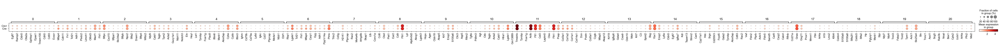

In [76]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=10,groupby="sample")

In [77]:
cluster2annotation = {
     '0': 'Endothelial cell',
     '1': 'Stromal Cell',
     '2': 'Alveolar Cell',
     '3': 'Macrophage/Neutrophil',
     '4': 'B-cell',
     '5': 'Stromal Cell',
     '6': 'Smooth muscle cell/Stromal Cell',
     '7': 'Stromal Cell',
     '8': 'T-cell',
    '9': 'Macrophages',
     '10': 'Alveolar Cells',
     '11': 'Smooth muscle cell',
     '12': 'Neuronal Cell',
     '13': 'Dendritic Cell',
     '14': 'Macrophages',
     '15': 'Smooth muscle cell',
     '16': 'Endothelial cell',
     '17': 'Macrophages',
      '18': 'Endothelial cell',
     '19': 'Stromal Cell',
     '20': 'Neutrophil',
     '21': 'Lung Clara cell',
     '22': 'Neutrophil',
     '23': 'Oligodendrocyte',
     '24': 'Cardiomyocyte',
     '25': 'Not decided'
}

In [78]:
adata.obs['cell type'] = adata.obs['leiden_03'].map(cluster2annotation).astype('category')

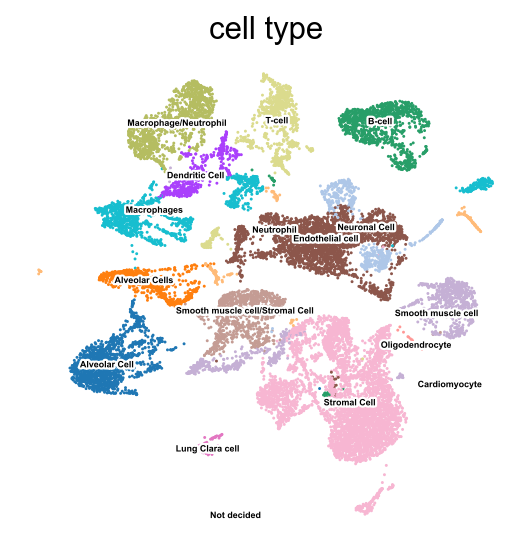

In [79]:
sc.pl.umap(adata, color='cell type', legend_loc='on data',
           frameon=False, legend_fontsize=4, legend_fontoutline=2)

In [80]:
cluster2annotation1 = {
     '0': 'Endothelial cell',
     '1': '',
     '2': 'Alveolar Cell',
     '3': 'Macrophage/Neutrophil',
     '4': 'B-cell',
     '5': '',
     '6': '',
     '7': '',
     '8': 'T-cell',
    '9': 'Macrophages',
     '10': 'Alveolar Cells',
     '11': '',
     '12': 'Neuronal Cell',
     '13': 'Dendritic Cell',
     '14': 'Macrophages',
     '15': '',
     '16': 'Endothelial cell',
     '17': 'Macrophages',
      '18': 'Endothelial cell',
     '19': '',
     '20': 'Neutrophil',
     '21': '',
     '22': 'Neutrophil',
     '23': '',
     '24': '',
     '25': ''
}

In [81]:
adata.obs['cell type_v2'] = adata.obs['leiden_03'].map(cluster2annotation1).astype('category')

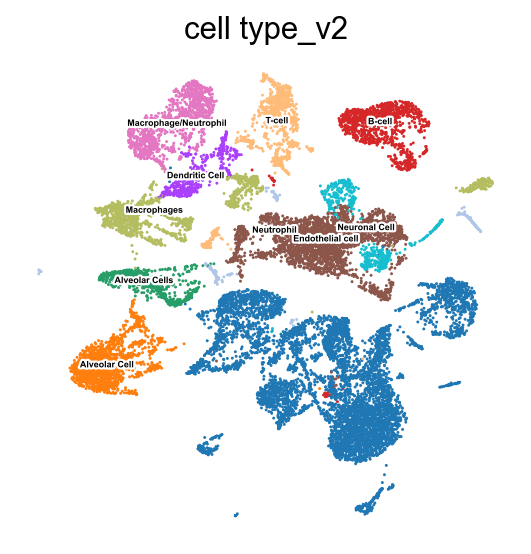

In [82]:
sc.pl.umap(adata, color='cell type_v2', legend_loc='on data',
           frameon=False, legend_fontsize=4, legend_fontoutline=2)

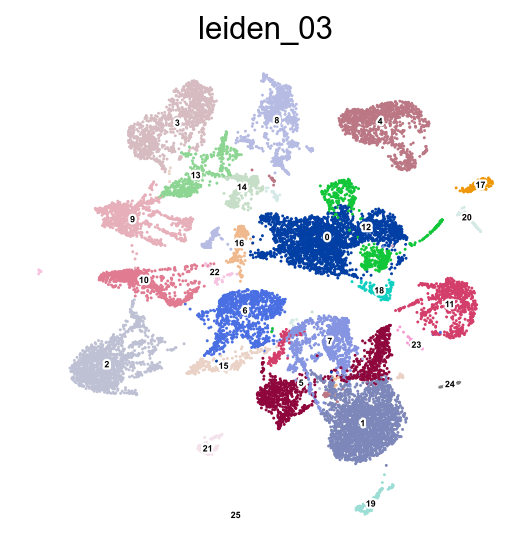

In [83]:
sc.pl.umap(adata, color='leiden_03', legend_loc='on data',
           frameon=False, legend_fontsize=4, legend_fontoutline=2)

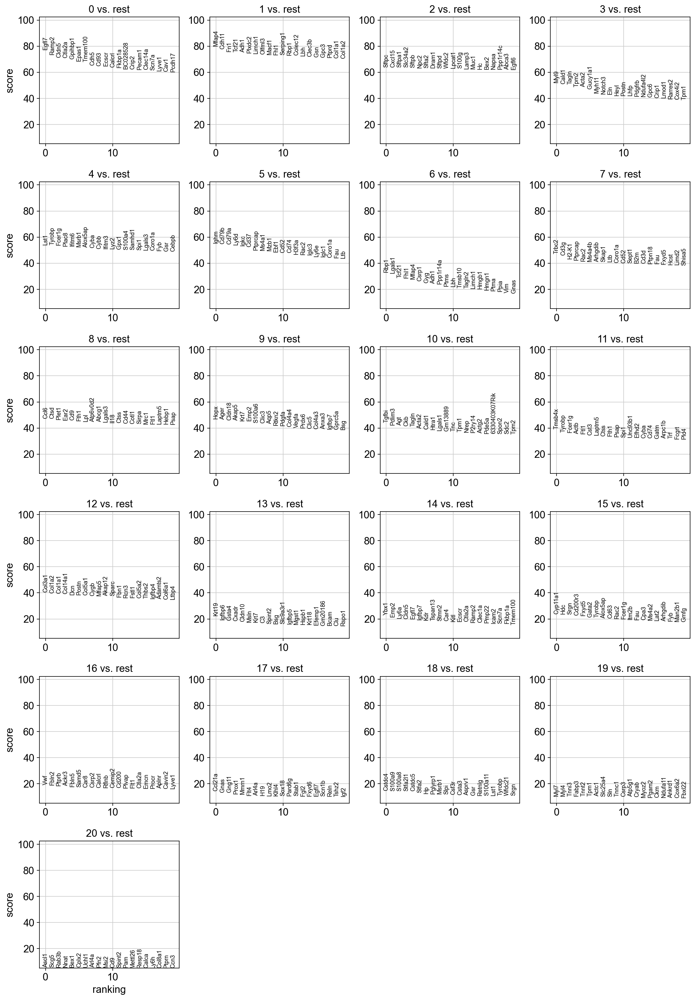

In [84]:
sc.pl.rank_genes_groups(adata)

In [85]:
sc.tl.rank_genes_groups(adata, groupby='cell type_v2', method='wilcoxon')

ranking genes
    finished (0:00:19)


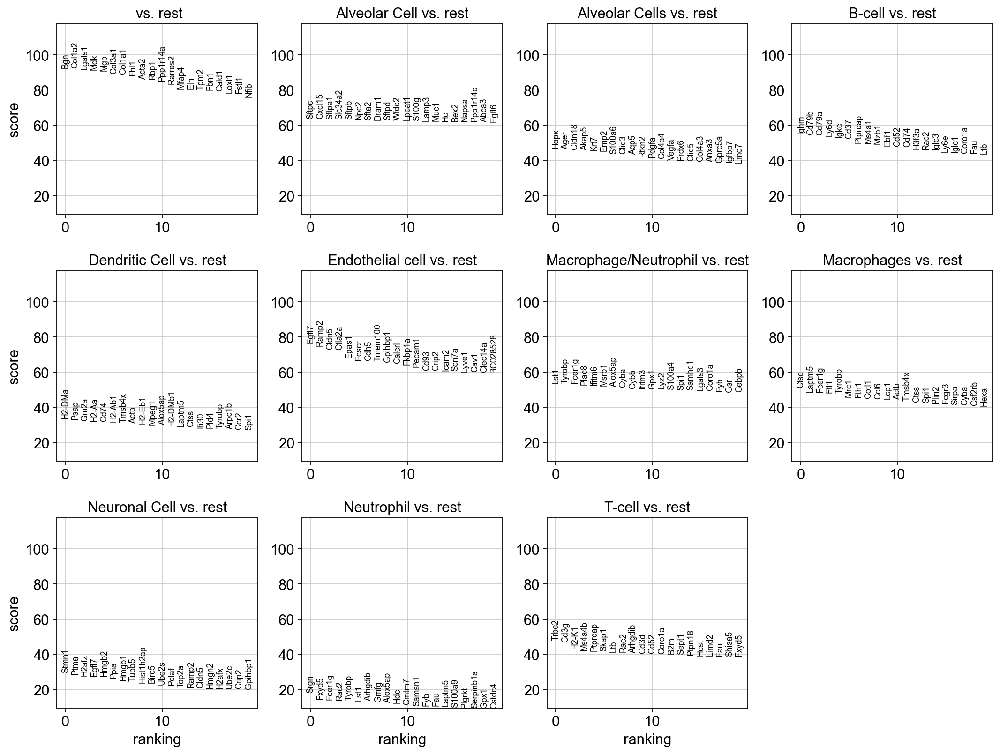

In [86]:
sc.pl.rank_genes_groups(adata)

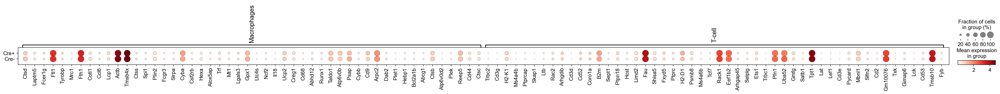

In [87]:
axs = sc.pl.rank_genes_groups_dotplot(adata, n_genes=50, groups=['Macrophages', 'T-cell'],groupby = 'sample')

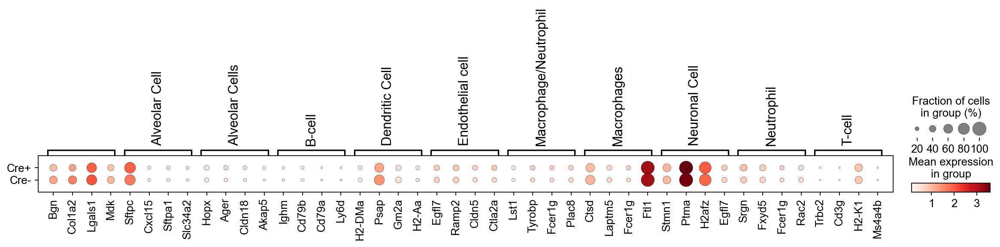

In [88]:
axs = sc.pl.rank_genes_groups_dotplot(adata,groupby='sample', n_genes=4)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell type_v2']`


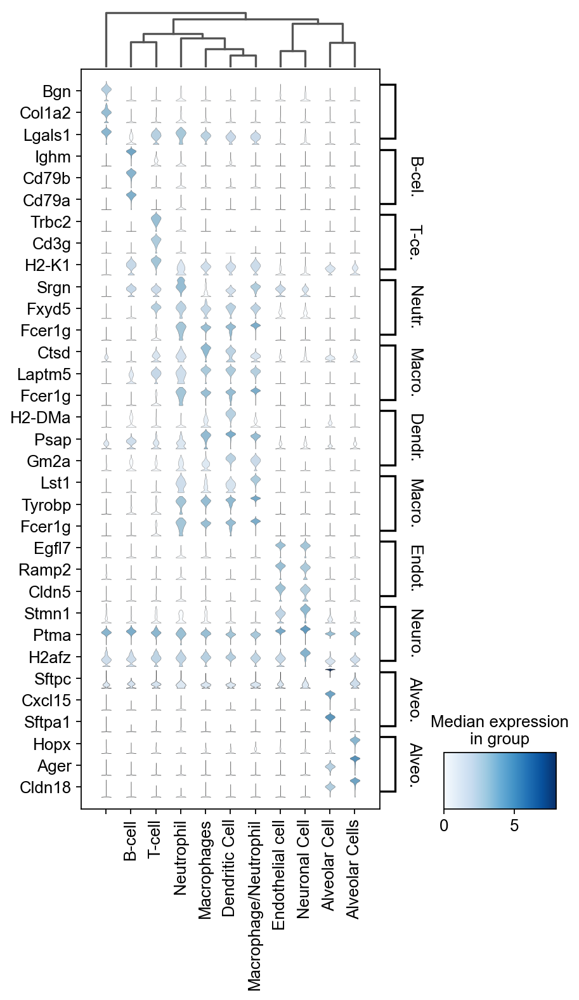

In [89]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=3, swap_axes=True, figsize=(6, 10), width=0.4)

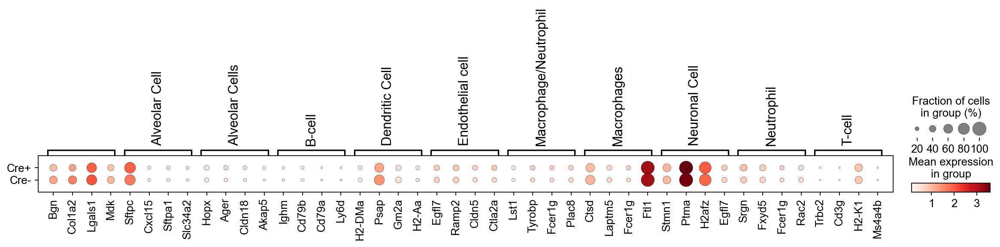

In [90]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4,groupby = 'sample')

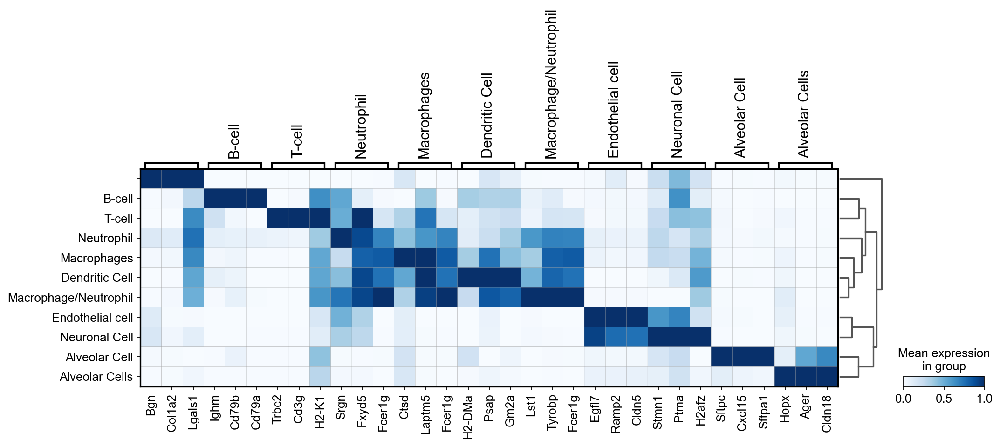

In [91]:
axs = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=3, standard_scale='var', cmap='Blues')

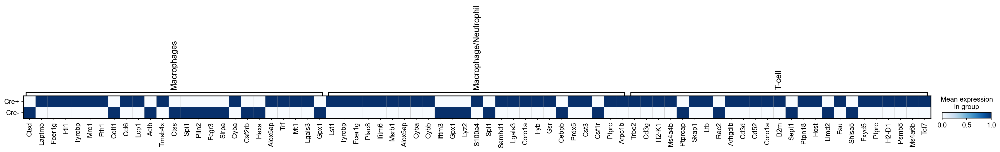

In [92]:
axs = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=25, standard_scale='var', cmap='Blues',groups=['Macrophages','Macrophage/Neutrophil','T-cell'],groupby = 'sample')

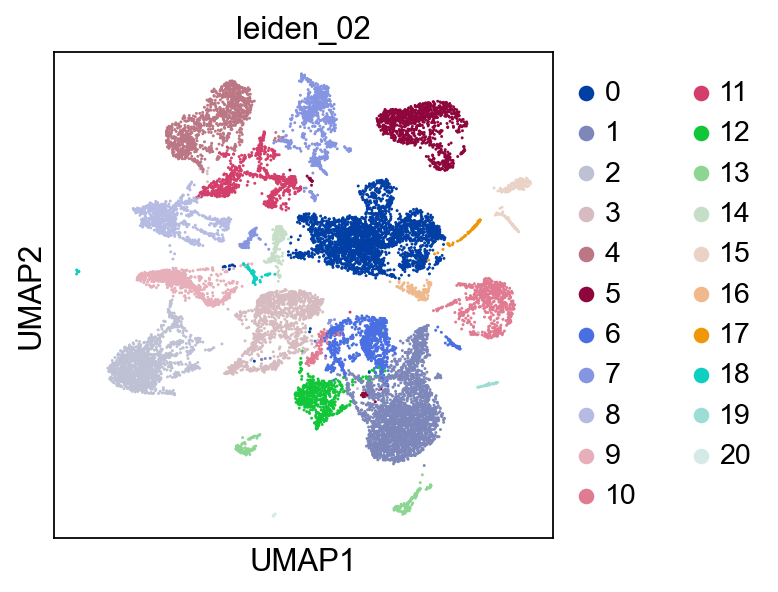

In [93]:
sc.pl.umap(adata, color=['leiden_02'])

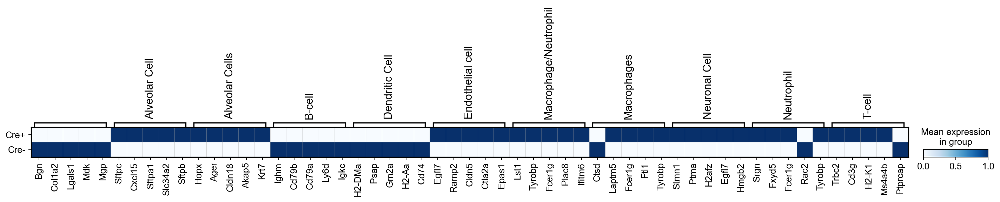

In [94]:
axs = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, standard_scale='var', cmap='Blues',groupby = 'sample')

In [95]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_10', 'leiden_03', 'leiden_02', 'leiden_01', 'leiden_001', 'cell type', 'cell type_v2'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_sample', 'hvg', 'leiden', 'leiden_01_colors', 'leiden_02_colors', 'leiden_03_colors', 'leiden_10_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap', 'wilcoxon', 'cell type_colors', 'cell type_v2_colors', 'dendrogram_cell type_v2'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [96]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_10', 'leiden_03', 'leiden_02', 'leiden_01', 'leiden_001', 'cell type', 'cell type_v2'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_sample', 'hvg', 'leiden', 'leiden_01_colors', 'leiden_02_colors', 'leiden_03_colors', 'leiden_10_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap', 'wilcoxon', 'cell type_colors', 'cell type_v2_colors', 'dendrogram_cell type_v2'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

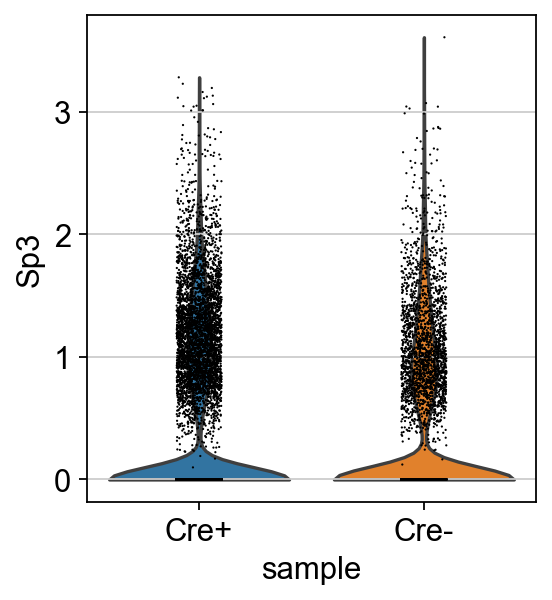

In [97]:
sc.pl.violin(adata,['Sp3'], groupby='sample')

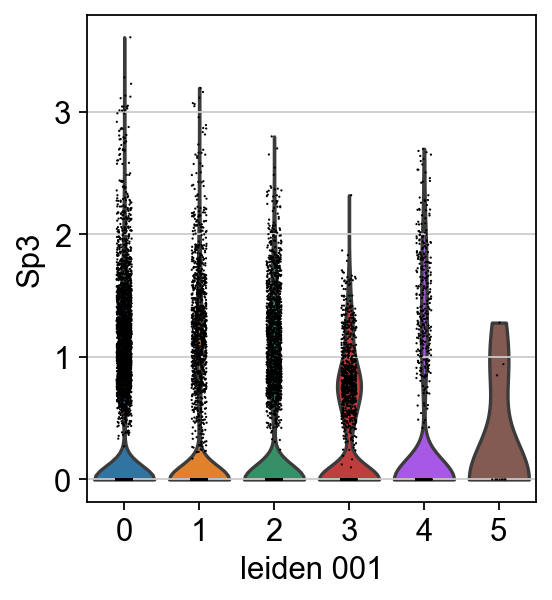

In [98]:
sc.pl.violin(adata,['Sp3'], groupby='leiden_001')

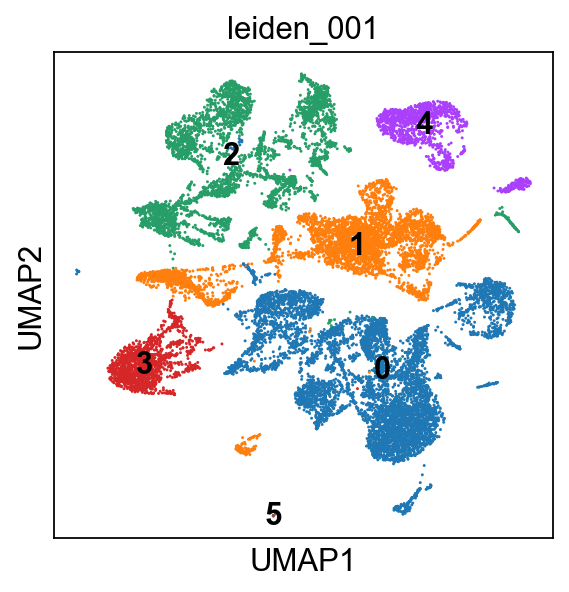

In [99]:
sc.pl.umap(adata,color='leiden_001',legend_loc='on data')

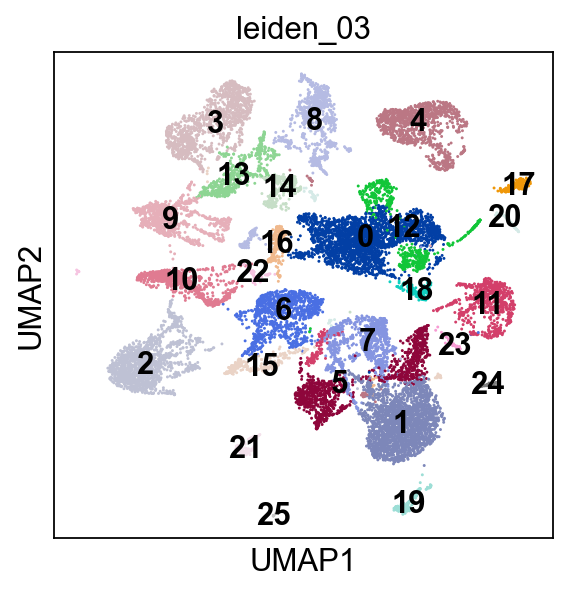

In [100]:
sc.pl.umap(adata,color='leiden_03',legend_loc='on data')

In [101]:
#macrophages : 3, 9, 13, 14, 22

In [174]:
cluster2annotation_macro = {
     '0': '',
     '1': '',
     '2': '',
     '3': 'Macrophages',
     '4': '',
     '5': '',
     '6': '',
     '7': '',
     '8': '',
    '9': 'Macrophages',
     '10': '',
     '11': '',
     '12': '',
     '13': 'Macrophages',
     '14': 'Macrophages',
     '15': '',
     '16': '',
     '17': '',
      '18': '',
     '19': '',
     '20': '',
     '21': '',
     '22': 'Macrophages',
     '23': '',
     '24': '',
     '25': ''
}

In [175]:
adata.obs['cell type'] = adata.obs['leiden_03'].map(cluster2annotation_macro).astype('category')

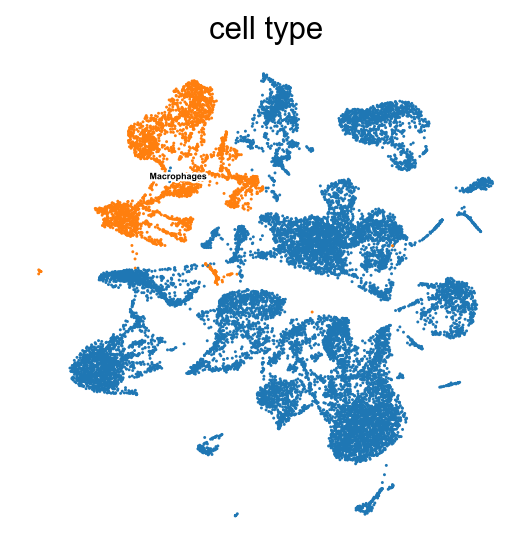

In [176]:
sc.pl.umap(adata, color='cell type', legend_loc='on data',
           frameon=False, legend_fontsize=4, legend_fontoutline=2)

In [105]:
adata.obs

,sample,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,leiden_10,leiden_03,leiden_02,leiden_01,leiden_001,cell type,cell type_v2
AAACCCAAGGAAGTAG-1-0,Cre-,463,0,524,722.0,0.0,0.000000,115.0,15.927978,2.0,0.277008,0.000000,722.0,10,0,0,1,1,,Endothelial cell
AAACCCAGTCGAACAG-1-0,Cre-,4067,0,4166,19657.0,863.0,4.390293,4431.0,22.541588,8.0,0.040698,0.043903,19657.0,19,13,11,3,2,Macrophages,Dendritic Cell
AAACCCAGTCTTAGTG-1-0,Cre-,2238,0,2332,7548.0,220.0,2.914680,1481.0,19.621092,1.0,0.013249,0.029147,7548.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
AAACCCAGTGCACAAG-1-0,Cre-,708,0,788,1440.0,1.0,0.069444,408.0,28.333334,3.0,0.208333,0.000694,1440.0,10,0,0,1,1,,Endothelial cell
AAACCCATCCTGTAAG-1-0,Cre-,4627,0,4729,18779.0,677.0,3.605091,3196.0,17.019011,15.0,0.079876,0.036051,18779.0,30,19,13,13,0,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTACCGCGT-1-3,Cre+,952,3,1034,1713.0,156.0,9.106830,280.0,16.345592,0.0,0.000000,0.091068,1713.0,1,0,0,1,1,,Endothelial cell
TTTGGTTGTGAGTCAG-1-3,Cre+,1753,3,1848,4385.0,143.0,3.261117,1065.0,24.287342,0.0,0.000000,0.032611,4385.0,0,1,1,0,0,,
TTTGGTTTCCGTCCTA-1-3,Cre+,3024,3,3122,8911.0,353.0,3.961396,1716.0,19.257099,44.0,0.493772,0.039614,8911.0,0,1,1,0,0,,
TTTGTTGGTACGCGTC-1-3,Cre+,1544,3,1635,3234.0,155.0,4.792826,550.0,17.006802,0.0,0.000000,0.047928,3234.0,5,11,10,10,0,,


In [106]:
adata_sub = adata[adata.obs.leiden_03.isin(['3', '9', '13', '14', '22'])]

In [107]:
adata_sub.obs

,sample,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,leiden_10,leiden_03,leiden_02,leiden_01,leiden_001,cell type,cell type_v2
AAACCCAGTCGAACAG-1-0,Cre-,4067,0,4166,19657.0,863.0,4.390293,4431.0,22.541588,8.0,0.040698,0.043903,19657.0,19,13,11,3,2,Macrophages,Dendritic Cell
AAACCCAGTCTTAGTG-1-0,Cre-,2238,0,2332,7548.0,220.0,2.914680,1481.0,19.621092,1.0,0.013249,0.029147,7548.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
AAACCCATCCTTGGAA-1-0,Cre-,4812,0,4920,28756.0,1472.0,5.118932,7446.0,25.893726,9.0,0.031298,0.051189,28756.0,25,13,11,3,2,Macrophages,Dendritic Cell
AAAGGGCGTGCAACGA-1-0,Cre-,3492,0,3592,11527.0,744.0,6.454411,1835.0,15.919146,5.0,0.043376,0.064544,11527.0,21,14,11,11,2,Macrophages,Macrophages
AAAGTCCGTCACGCTG-1-0,Cre-,4020,0,4122,16789.0,627.0,3.734588,3502.0,20.858896,9.0,0.053607,0.037346,16789.0,6,9,8,3,2,Macrophages,Macrophages
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCATGAGGCGAAGG-1-3,Cre+,1899,3,1992,4623.0,155.0,3.352801,802.0,17.348042,1.0,0.021631,0.033528,4623.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
TTTCCTCTCAGACCGC-1-3,Cre+,1989,3,2082,5208.0,130.0,2.496160,1085.0,20.833332,0.0,0.000000,0.024962,5208.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
TTTGACTAGCCAACCC-1-3,Cre+,2778,3,2877,10126.0,357.0,3.525578,2660.0,26.269011,0.0,0.000000,0.035256,10126.0,19,13,11,3,2,Macrophages,Dendritic Cell
TTTGATCGTTATTCCT-1-3,Cre+,3105,3,3204,8997.0,350.0,3.890186,1805.0,20.062243,1.0,0.011115,0.038902,8997.0,13,3,4,5,2,Macrophages,Macrophage/Neutrophil


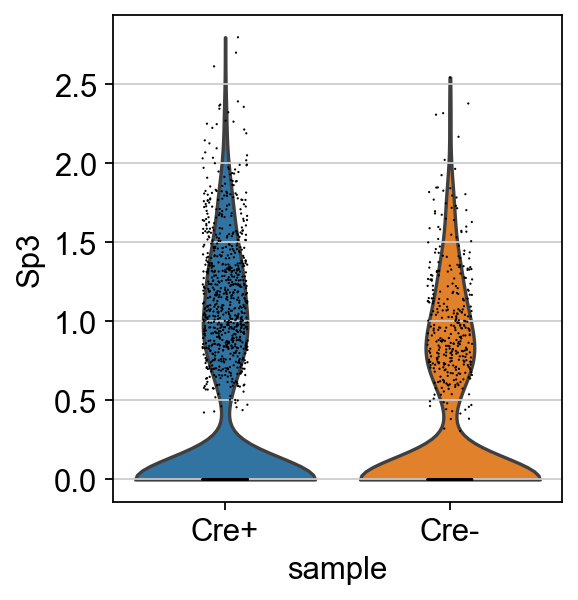

In [108]:
sc.pl.violin(adata_sub,['Sp3'], groupby='sample')

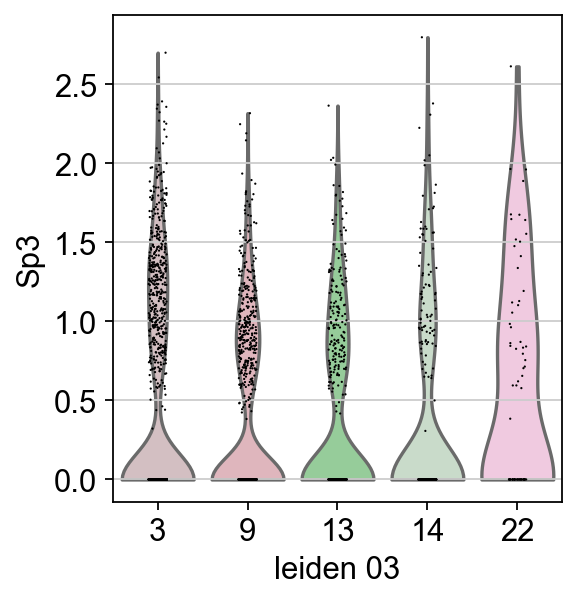

In [109]:
sc.pl.violin(adata_sub,['Sp3'], groupby='leiden_03')

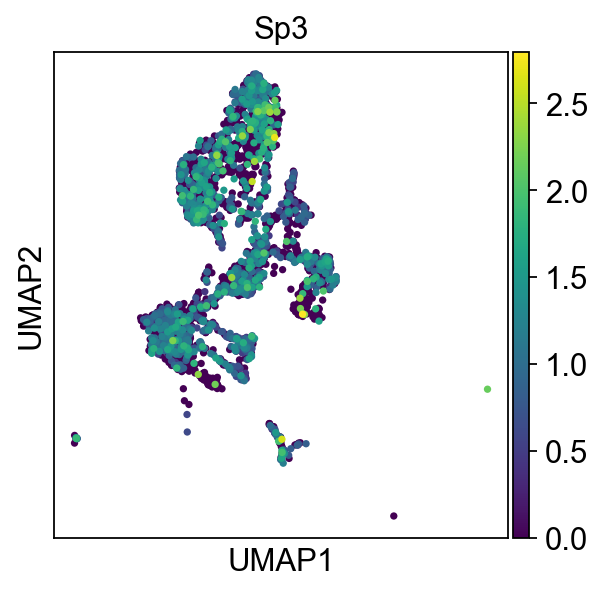

In [111]:
sc.pl.umap(adata_sub,color = 'Sp3')

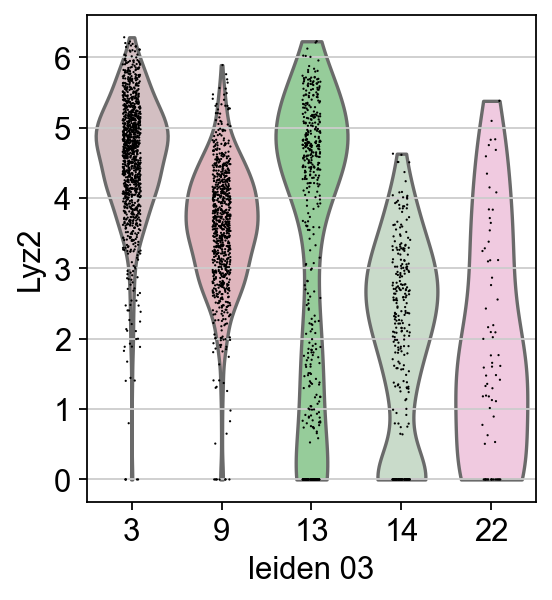

In [112]:
sc.pl.violin(adata_sub,['Lyz2'], groupby='leiden_03')

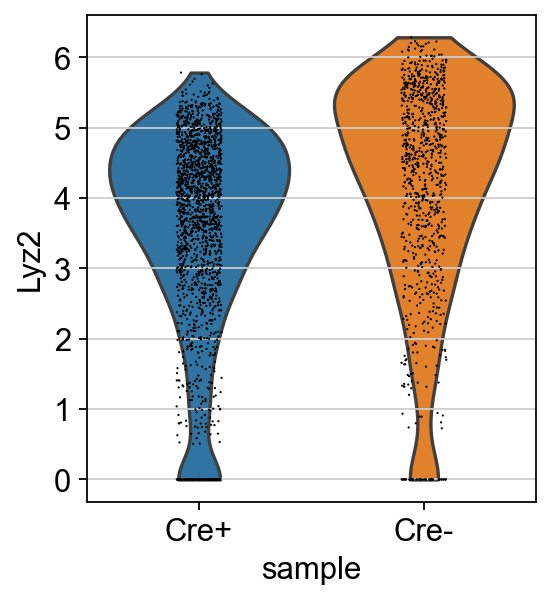

In [113]:
sc.pl.violin(adata_sub,['Lyz2'], groupby='sample')

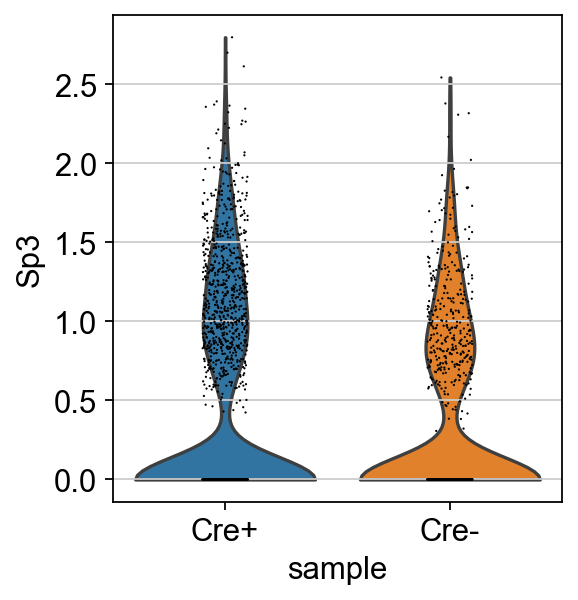

In [114]:
sc.pl.violin(adata_sub,['Sp3'], groupby='sample')

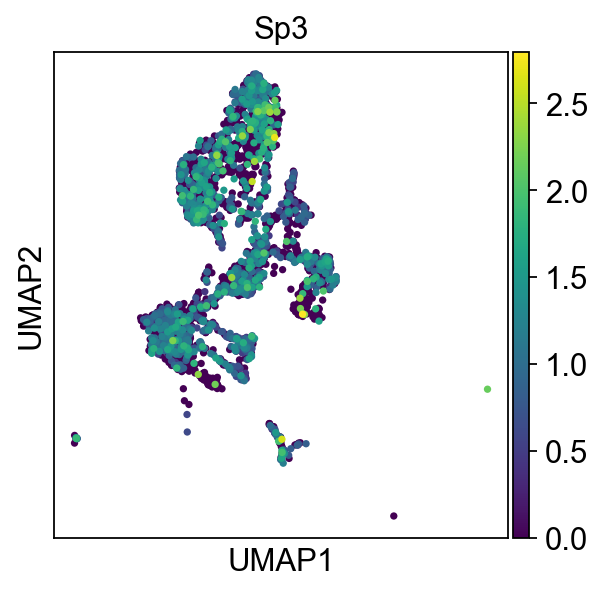

In [115]:
sc.pl.umap(adata_sub,color = 'Sp3')

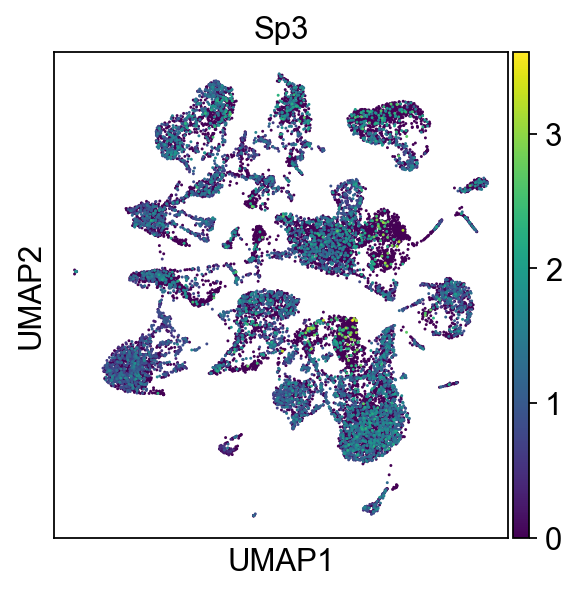

In [116]:
sc.pl.umap(adata,color = 'Sp3')

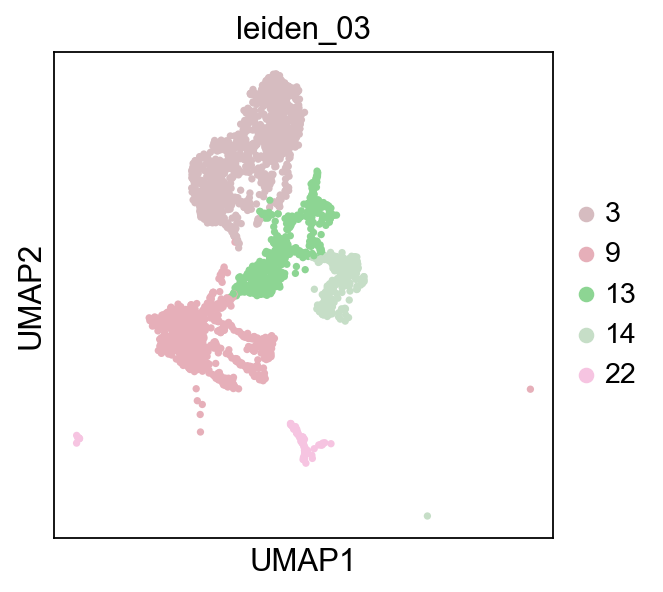

In [117]:
sc.pl.umap(adata_sub,color = 'leiden_03')

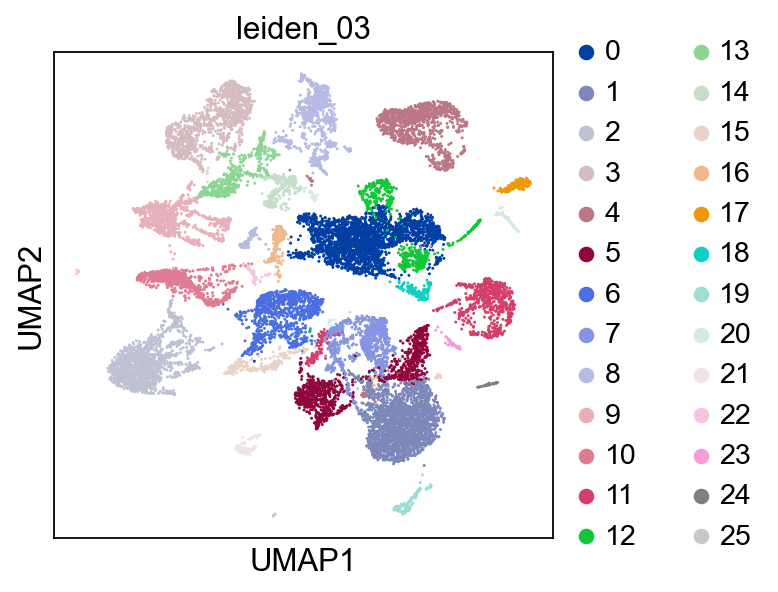

In [118]:
sc.pl.umap(adata,color = 'leiden_03')

In [119]:
sc.tl.umap(adata_sub)

computing UMAP


Trying to set attribute `._uns` of view, copying.


    finished (0:00:03)


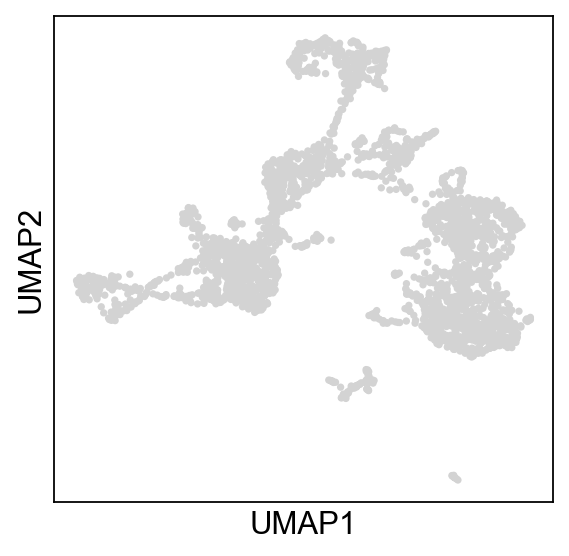

In [120]:
sc.pl.umap(adata_sub)

In [122]:
adata1 = adata.obs.sample

In [123]:
adata.obs.leiden_01

AAACCCAAGGAAGTAG-1-0     1
AAACCCAGTCGAACAG-1-0     3
AAACCCAGTCTTAGTG-1-0     5
AAACCCAGTGCACAAG-1-0     1
AAACCCATCCTGTAAG-1-0    13
                        ..
TTTGGTTGTACCGCGT-1-3     1
TTTGGTTGTGAGTCAG-1-3     0
TTTGGTTTCCGTCCTA-1-3     0
TTTGTTGGTACGCGTC-1-3    10
TTTGTTGTCGAGAGAC-1-3     0
Name: leiden_01, Length: 17157, dtype: category
Categories (18, object): ['0', '1', '2', '3', ..., '14', '15', '16', '17']

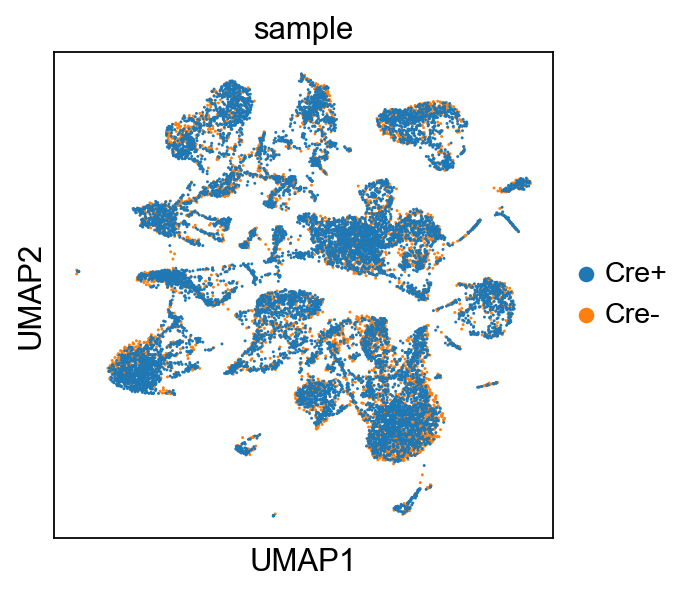

In [125]:
sc.pl.umap(adata, color='sample')

In [126]:
print(adata.obs['sample'].value_counts())

Cre+    11192
Cre-     5965
Name: sample, dtype: int64


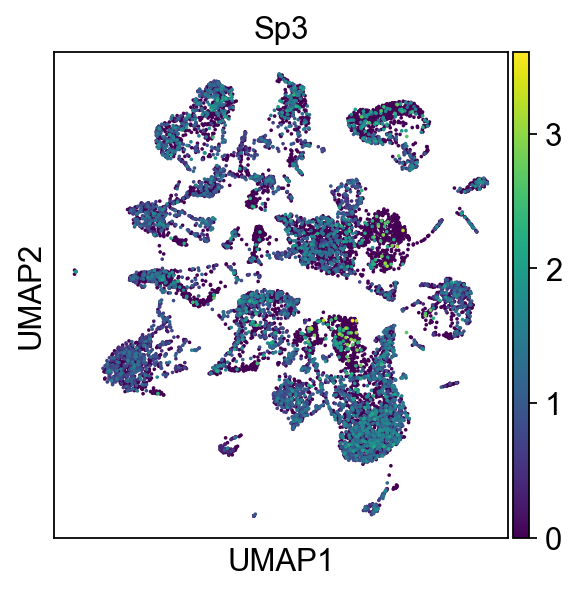

In [127]:
sc.pl.umap(adata[1:11192], color='Sp3')

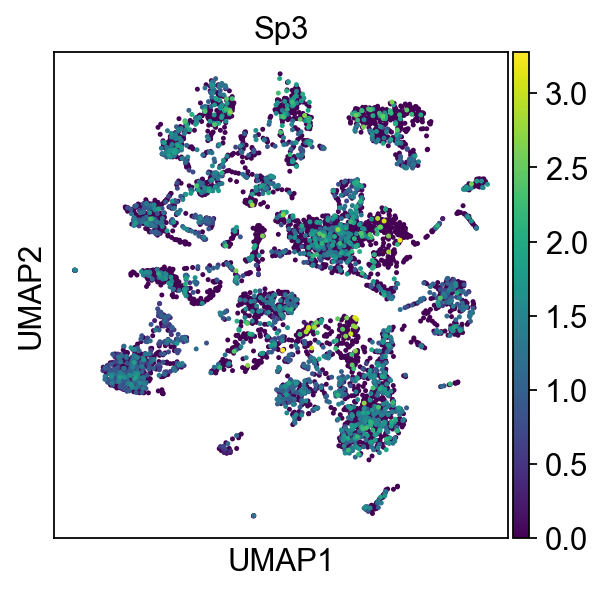

In [128]:
sc.pl.umap(adata[11192:11192+5965], color='Sp3')

In [129]:
print(adata_sub.obs['sample'].value_counts())

Cre+    1861
Cre-     907
Name: sample, dtype: int64


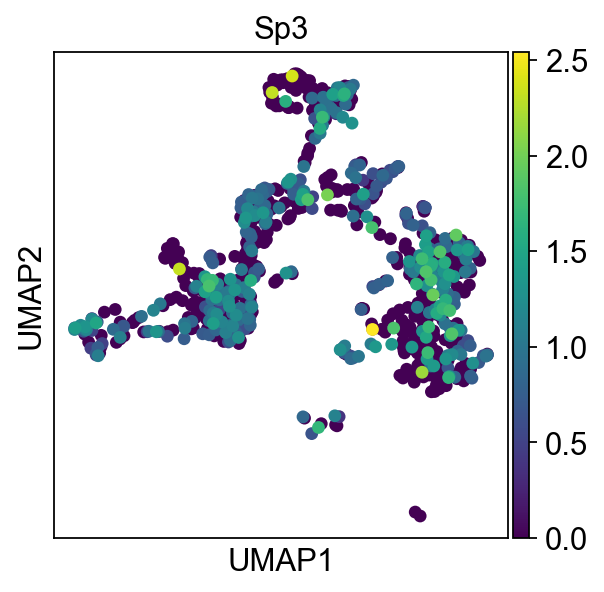

In [130]:
sc.pl.umap(adata_sub[1:907], color='Sp3')

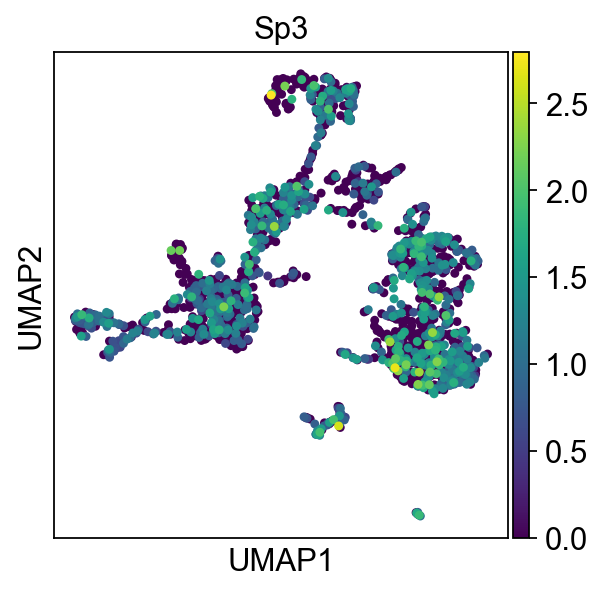

In [131]:
sc.pl.umap(adata_sub[907:907+1861], color='Sp3')

In [132]:
adata_sub[907:907+1861].obs

,sample,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,leiden_10,leiden_03,leiden_02,leiden_01,leiden_001,cell type,cell type_v2
AAACCCACAATACGCT-1-2,Cre+,852,2,937,2943.0,7.0,0.237853,972.0,33.027523,0.0,0.000000,0.002379,2943.0,42,9,8,3,2,Macrophages,Macrophages
AAACGCTCAAGTCGTT-1-2,Cre+,2452,2,2549,7105.0,345.0,4.855735,1393.0,19.605911,1.0,0.014075,0.048557,7105.0,6,9,8,3,2,Macrophages,Macrophages
AAAGAACAGATAACAC-1-2,Cre+,2334,2,2431,9640.0,292.0,3.029046,2038.0,21.141079,1.0,0.010373,0.030290,9640.0,19,13,11,3,2,Macrophages,Dendritic Cell
AAAGAACGTGTTAACC-1-2,Cre+,2282,2,2376,7364.0,234.0,3.177621,1692.0,22.976643,0.0,0.000000,0.031776,7364.0,21,14,11,11,2,Macrophages,Macrophages
AAAGGGCCATGTGACT-1-2,Cre+,2993,2,3090,9246.0,405.0,4.380273,1501.0,16.234047,1.0,0.010815,0.043803,9246.0,6,9,8,3,2,Macrophages,Macrophages
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCATGAGGCGAAGG-1-3,Cre+,1899,3,1992,4623.0,155.0,3.352801,802.0,17.348042,1.0,0.021631,0.033528,4623.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
TTTCCTCTCAGACCGC-1-3,Cre+,1989,3,2082,5208.0,130.0,2.496160,1085.0,20.833332,0.0,0.000000,0.024962,5208.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
TTTGACTAGCCAACCC-1-3,Cre+,2778,3,2877,10126.0,357.0,3.525578,2660.0,26.269011,0.0,0.000000,0.035256,10126.0,19,13,11,3,2,Macrophages,Dendritic Cell
TTTGATCGTTATTCCT-1-3,Cre+,3105,3,3204,8997.0,350.0,3.890186,1805.0,20.062243,1.0,0.011115,0.038902,8997.0,13,3,4,5,2,Macrophages,Macrophage/Neutrophil


In [133]:
chk = adata_sub[1:907].obs

In [134]:
print(chk['sample'].value_counts())

Cre-    906
Name: sample, dtype: int64


In [135]:
chk = adata_sub[907:907+1861].obs

In [136]:
print(chk['sample'].value_counts())

Cre+    1861
Name: sample, dtype: int64


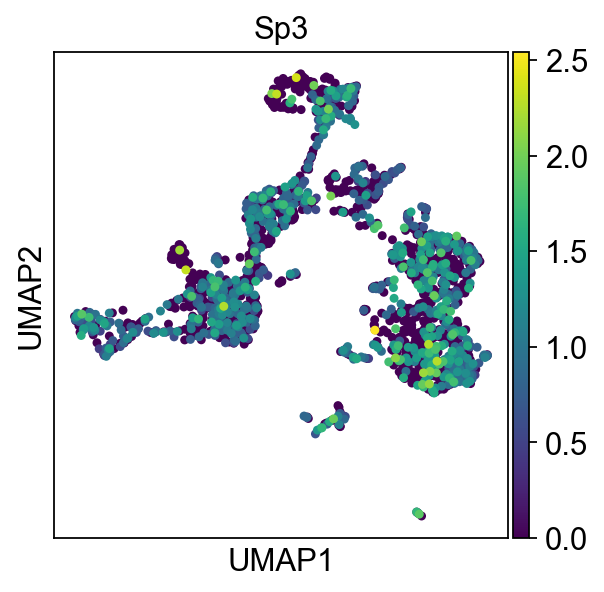

In [137]:
sc.pl.umap(adata_sub[1:1861], color='Sp3')

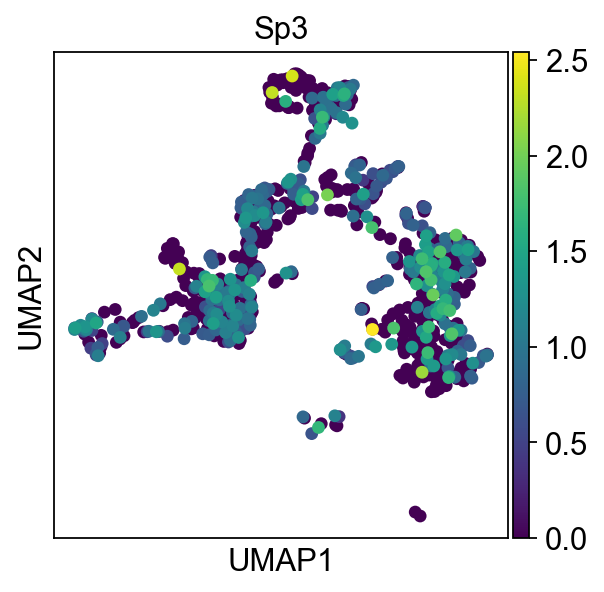

In [138]:
sc.pl.umap(adata_sub[1:907], color='Sp3')

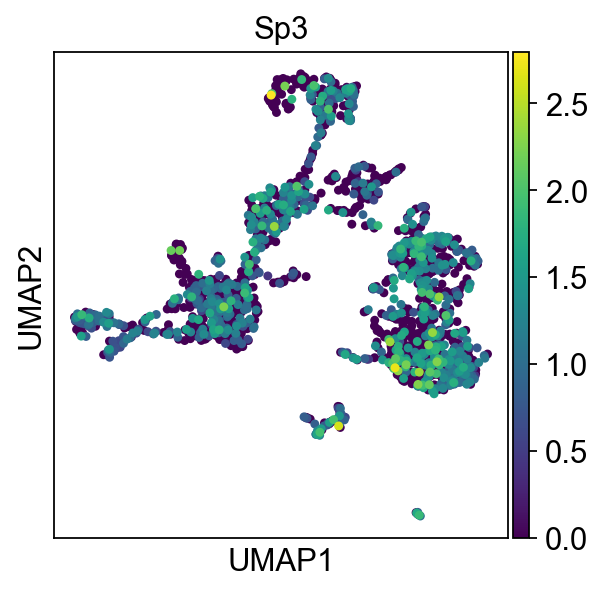

In [139]:
sc.pl.umap(adata_sub[907:907+1861], color='Sp3')

In [143]:
axs = sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=3, standard_scale='var', cmap='Blues')

ValueError: Incompatible observations. Dendrogram data has 11 categories but current groupby observation ['cell type_v2'] contains 4 categories. Most likely the underlying groupby observation changed after the initial computation of `sc.tl.dendrogram`. Please run `sc.tl.dendrogram` again.'

In [142]:
sc.tl.dendrogram(adata_sub,groupby = 'sample')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample']`


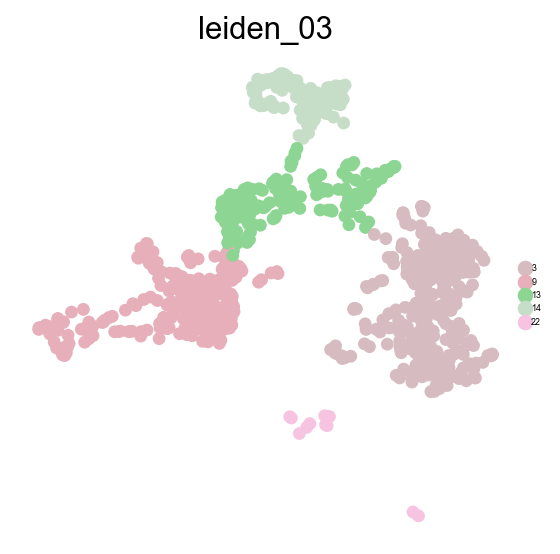

In [146]:
sc.pl.umap(adata_sub[1:907], color='leiden_03',
           frameon=False, legend_fontsize=4, legend_fontoutline=2)

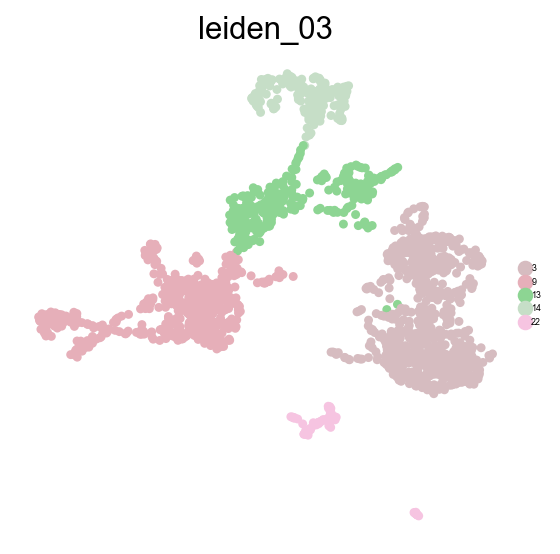

In [147]:
sc.pl.umap(adata_sub[907:907+1861], color='leiden_03',
           frameon=False, legend_fontsize=4, legend_fontoutline=2)

In [148]:
axs = sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=3, standard_scale='var', cmap='Blues')

ValueError: Incompatible observations. Dendrogram data has 11 categories but current groupby observation ['cell type_v2'] contains 4 categories. Most likely the underlying groupby observation changed after the initial computation of `sc.tl.dendrogram`. Please run `sc.tl.dendrogram` again.'

In [159]:
sc.tl.dendrogram(adata_sub,groupby='cell type')

    using 'X_pca' with n_pcs = 50


ValueError: The number of observations cannot be determined on an empty distance matrix.

categories: Dendritic Cell, Macrophage/Neutrophil, Macrophages, etc.
var_group_labels: , Alveolar Cell, Alveolar Cells, etc.


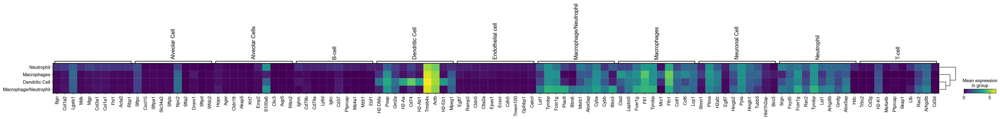

In [157]:
axs = sc.pl.rank_genes_groups_matrixplot(adata_sub)

In [152]:
adata_sub

AnnData object with n_obs × n_vars = 2768 × 2789
    obs: 'sample', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_10', 'leiden_03', 'leiden_02', 'leiden_01', 'leiden_001', 'cell type', 'cell type_v2'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_sample', 'hvg', 'leiden', 'leiden_01_colors', 'leiden_02_colors', 'leiden_03_colors', 'leiden_10_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap', 'wilcoxon', 'cell type_v2_colors', 'dendrogram_cell type_v2', 'leiden_001_colors', 'dendrogram_leiden_03'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivitie

In [158]:
adata_sub.obs

,sample,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,leiden_10,leiden_03,leiden_02,leiden_01,leiden_001,cell type,cell type_v2
AAACCCAGTCGAACAG-1-0,Cre-,4067,0,4166,19657.0,863.0,4.390293,4431.0,22.541588,8.0,0.040698,0.043903,19657.0,19,13,11,3,2,Macrophages,Dendritic Cell
AAACCCAGTCTTAGTG-1-0,Cre-,2238,0,2332,7548.0,220.0,2.914680,1481.0,19.621092,1.0,0.013249,0.029147,7548.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
AAACCCATCCTTGGAA-1-0,Cre-,4812,0,4920,28756.0,1472.0,5.118932,7446.0,25.893726,9.0,0.031298,0.051189,28756.0,25,13,11,3,2,Macrophages,Dendritic Cell
AAAGGGCGTGCAACGA-1-0,Cre-,3492,0,3592,11527.0,744.0,6.454411,1835.0,15.919146,5.0,0.043376,0.064544,11527.0,21,14,11,11,2,Macrophages,Macrophages
AAAGTCCGTCACGCTG-1-0,Cre-,4020,0,4122,16789.0,627.0,3.734588,3502.0,20.858896,9.0,0.053607,0.037346,16789.0,6,9,8,3,2,Macrophages,Macrophages
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCATGAGGCGAAGG-1-3,Cre+,1899,3,1992,4623.0,155.0,3.352801,802.0,17.348042,1.0,0.021631,0.033528,4623.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
TTTCCTCTCAGACCGC-1-3,Cre+,1989,3,2082,5208.0,130.0,2.496160,1085.0,20.833332,0.0,0.000000,0.024962,5208.0,12,3,4,5,2,Macrophages,Macrophage/Neutrophil
TTTGACTAGCCAACCC-1-3,Cre+,2778,3,2877,10126.0,357.0,3.525578,2660.0,26.269011,0.0,0.000000,0.035256,10126.0,19,13,11,3,2,Macrophages,Dendritic Cell
TTTGATCGTTATTCCT-1-3,Cre+,3105,3,3204,8997.0,350.0,3.890186,1805.0,20.062243,1.0,0.011115,0.038902,8997.0,13,3,4,5,2,Macrophages,Macrophage/Neutrophil


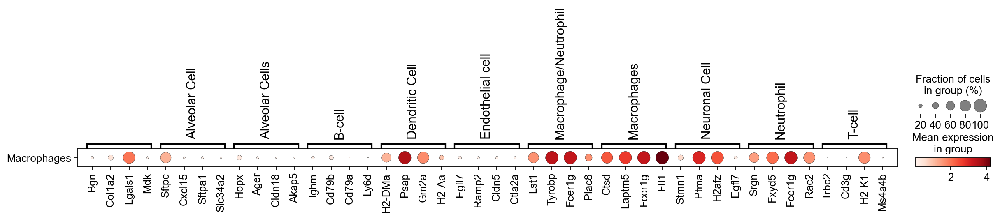

In [164]:
axs = sc.pl.rank_genes_groups_dotplot(adata_sub[1:907],groupby='cell type', n_genes=4)

In [166]:
adata_sub.obs['cell type_v2'] = 'Macrophages'

In [167]:
adata_sub.obs

,sample,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,leiden_10,leiden_03,leiden_02,leiden_01,leiden_001,cell type,cell type_v2
AAACCCAGTCGAACAG-1-0,Cre-,4067,0,4166,19657.0,863.0,4.390293,4431.0,22.541588,8.0,0.040698,0.043903,19657.0,19,13,11,3,2,Macrophages,Macrophages
AAACCCAGTCTTAGTG-1-0,Cre-,2238,0,2332,7548.0,220.0,2.914680,1481.0,19.621092,1.0,0.013249,0.029147,7548.0,12,3,4,5,2,Macrophages,Macrophages
AAACCCATCCTTGGAA-1-0,Cre-,4812,0,4920,28756.0,1472.0,5.118932,7446.0,25.893726,9.0,0.031298,0.051189,28756.0,25,13,11,3,2,Macrophages,Macrophages
AAAGGGCGTGCAACGA-1-0,Cre-,3492,0,3592,11527.0,744.0,6.454411,1835.0,15.919146,5.0,0.043376,0.064544,11527.0,21,14,11,11,2,Macrophages,Macrophages
AAAGTCCGTCACGCTG-1-0,Cre-,4020,0,4122,16789.0,627.0,3.734588,3502.0,20.858896,9.0,0.053607,0.037346,16789.0,6,9,8,3,2,Macrophages,Macrophages
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCATGAGGCGAAGG-1-3,Cre+,1899,3,1992,4623.0,155.0,3.352801,802.0,17.348042,1.0,0.021631,0.033528,4623.0,12,3,4,5,2,Macrophages,Macrophages
TTTCCTCTCAGACCGC-1-3,Cre+,1989,3,2082,5208.0,130.0,2.496160,1085.0,20.833332,0.0,0.000000,0.024962,5208.0,12,3,4,5,2,Macrophages,Macrophages
TTTGACTAGCCAACCC-1-3,Cre+,2778,3,2877,10126.0,357.0,3.525578,2660.0,26.269011,0.0,0.000000,0.035256,10126.0,19,13,11,3,2,Macrophages,Macrophages
TTTGATCGTTATTCCT-1-3,Cre+,3105,3,3204,8997.0,350.0,3.890186,1805.0,20.062243,1.0,0.011115,0.038902,8997.0,13,3,4,5,2,Macrophages,Macrophages


/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1236: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'cell type_v2' as categorical


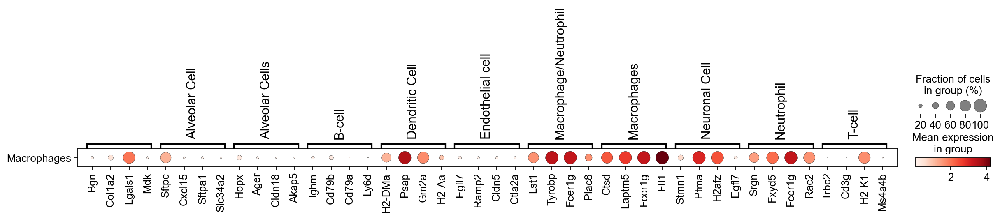

In [170]:
axs = sc.pl.rank_genes_groups_dotplot(adata_sub[1:907],groupby='cell type', n_genes=4)

In [169]:
sc.tl.dendrogram(adata_sub,groupby='cell type')

    using 'X_pca' with n_pcs = 50


ValueError: The number of observations cannot be determined on an empty distance matrix.

/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1236: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'cell type_v2' as categorical


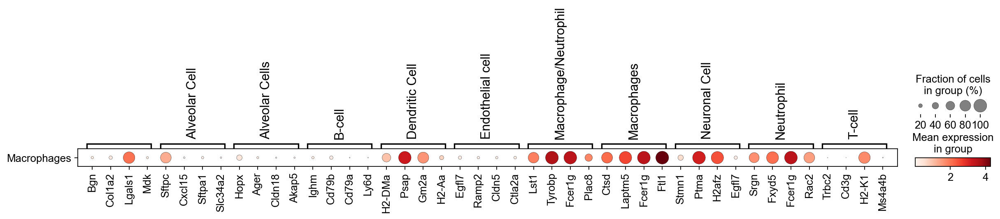

In [171]:
axs = sc.pl.rank_genes_groups_dotplot(adata_sub[907:907+1861],groupby='cell type', n_genes=4)

/Users/sshome/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell type_v2' as categorical


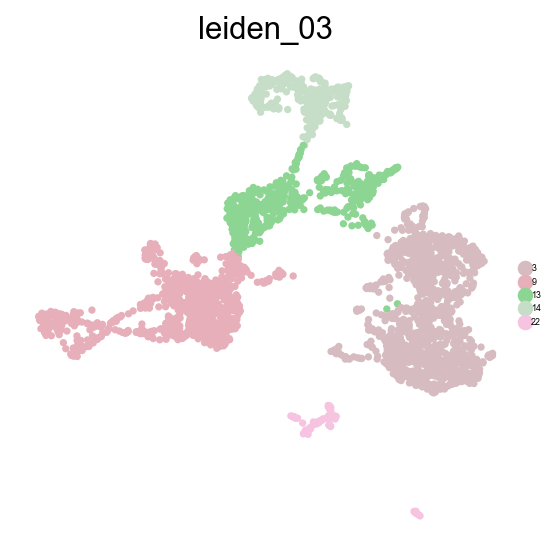

In [172]:
sc.pl.umap(adata_sub, color='leiden_03',frameon=False, legend_fontsize=4, legend_fontoutline=2)

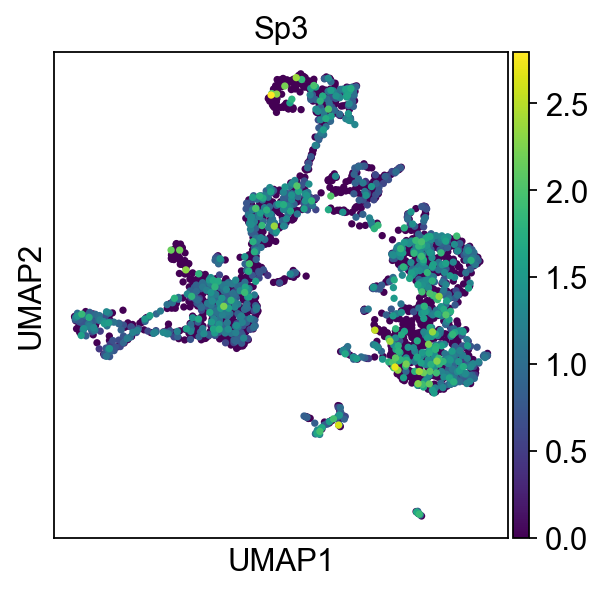

In [173]:
sc.pl.umap(adata_sub, color='Sp3')